# Command Tester
This file is meant to test all commands quickly. You can start from scratch and just hit play.<br>
<br>
Dependent on files inside `/_for testing`

In [ ]:
# Initiate & trigger ~/.openad creation.
#%run openad.ipynb
%openad get status

# Skip authorization.
auth_file_name = 'ds-auth.ext-v2.json'
auth_file_from = '_for_testing/' + auth_file_name
auth_file_to = os.path.expanduser('~/.openad/' + auth_file_name)
if not os.path.exists(auth_file_to):
    import shutil
    import os
    shutil.copyfile(auth_file_from, auth_file_to)
    print('Bypassed authorization.')
else:
    print('Already authorized.')

# Toolkits

In [ ]:
# In case you're not starting from scratch.
# %openad clear sessions
%openad remove toolkit DS4SD
%openad remove toolkit GT4SD
%openad remove toolkit ST4SD
%openad remove toolkit RXN

In [ ]:
# Error message.
%openad set context DS4SD

In [ ]:
# No toolkits yet.
%openad list toolkits

In [ ]:
%openad list all toolkits

In [ ]:
%openad add toolkit DS4SD

In [ ]:
%openad clear sessions

In [ ]:
%openad list all toolkits

In [ ]:
%openad set context DS4SD

In [ ]:
%openad set context DS4SD reset

# Workspaces

In [ ]:
# %run openad.ipynb
%openad list workspaces

In [ ]:
# %openad clear sessions
%openad remove workspace jupytest
%openad create workspace jupytest

In [ ]:
# This doesn't create the folder in Jupyter
%openad remove workspace jupytest1
%openad create workspace jupytest1 description('A test workspace') on path '~/Desktop'

In [ ]:
%openad remove workspace keeper
%openad create workspace keeper description('We keep this one')

In [ ]:
%openad list workspaces

In [ ]:
%openad get workspace keeper

In [ ]:
%openad set workspace default

In [ ]:
%openad remove workspace jupytest
%openad remove workspace jupytest1

# File System

In [ ]:
# No files yet
%openad list files

In [ ]:
# Import file from repo to workspace
%openad import from '~/openad_notebooks/examples/base_molecules.sdf' to 'base_molecules.sdf'
%openad import from '~/openad_notebooks/examples/base_molecules.csv' to 'base_molecules.csv'

In [ ]:
# Export from workspace to desktop
%openad export from 'base_molecules.sdf' to '~/Desktop/exported_molecules.sdf'

# Copying nested files also possible:
# %openad export from '_runs/my_run1.run' to '/Users/themoenen/Documents/Dump/test.run'

In [ ]:
# Import from desktop to workspace
%openad import from '~/Desktop/exported_molecules.sdf' to 'imported_molecules.sdf'

In [ ]:
# Copy from workspace to another workspace
%openad copy file 'imported_molecules.sdf' to 'keeper'

In [ ]:
# Delete
%openad remove 'imported_molecules.sdf'

# General

In [ ]:
%openad get status

In [ ]:
%openad display history

In [ ]:
%openad clear sessions

In [ ]:
# Not sure how we should do this in Jupyter... let's discuss.
# %openad edit config 'func_display_collection.json'

# Help

In [28]:
# TO DO: This should use iPython.display
#%run openad.ipynb
%openad intro

## Introduction to OpenAD

OpenAD is a CLI providing centralized access to a number of open-source scientific toolkits developed by IBM Research. These toolkits let you combine the power of artificial intelligence, computational chemistry and hybrid cloud to supercharge your discovery process and drastically accelerate your development timelines.<br><br><a target="_blank" href="http://accelerate.science">http://accelerate.science</a>


### Workspaces
A workspace is an isolated directory where all of your files, settings and runs are stored. This allows you to work on unrelated projects without them contaminating one another. You can create as many workspaces as you need, and each workspace comes with its own command history.<br><br><span style="color: #ccc">To see how to work with workspaces, run `workspace ?`</span>


### Toolkits
Toolkits are individual pieces of software that provide highly specialized functionality. You can think of OpenAD as the operating system, and toolkits as the applications. Toolkits can be installed and removed independently of one another, and you can switch between them at any time.<br><br>As of now, OpenAD supports 4 different toolkits.<br>• DS4SD - Deep Search<br>• GT4SD - Generative Toolkit<br>• ST4SD - Simulation Toolkit<br>• RXN - Digital Chemistry<br><br>To learn more about what any of these toolkits does, run its name: `ds4sd` / `gt4sd` / `st4sd` / `rxn`<br><br><span style="color: #ccc">To see how to work with toolkits, run `toolkit ?`</span>


### Contexts
After you've installed a toolkit, you need to set your context to that toolkit in order to access its functionality.<br><br>For example:<br>`add toolkit DS4SD`<br>`set context DS4SD`<br>`<do-xyz>`

### Runs
A run is a collection of commands that you can save and execute later. Runs are stored in your workspace, and can be shared with other users.<br><br><span style="color: #ccc">To see how to work with runs, run `run ?`</span>

In [29]:
%openad ?

## Available Commands - Main

General:<br>`openad`<br>`get status`<br>`display history `<br>`clear sessions`<br><br>Workspaces:<br>`set workspace <workspace_name>`<br>`get workspace [ <workspace_name> ]`<br>`create workspace <workspace_name> [ description('<description>') on path '<path>' ]`<br>`remove workspace <workspace_name> `<br>`list workspaces`<br><br>Toolkits:<br>`ds4sd`<br>`rxn`<br>`st4sd`<br>`gt4sd`<br>`list toolkits`<br>`list all toolkits`<br>`add toolkit <toolkit_name>`<br>`remove toolkit <toolkit_name>`<br>`set context <toolkit_name> [ reset ]`<br>`get context`<br>`unset context`<br><br>Runs:<br>`create run`<br>`save run as <run_name>`<br>`run <run_name>`<br>`list runs`<br>`display run <run_name>`<br><br>Utility:<br>`display data '<csv_filename>'`<br>`  -> result save [as '<csv_filename>']`<br>`  -> result open`<br>`  -> result edit`<br>`  -> result copy`<br>`  -> result display`<br>`show molecules using ( file '<mols_file>' | dataframe <dataframe> )<br>    [ save as '<sdf_or_csv_file>' | as molsobject ]`<br><br>LLM:<br>`tell me <how to do xyz>`<br>`set llm  <language_model_name>`<br>`clear llm auth`<br><br>File System:<br>`list files`<br>`import from '<external_source_file>' to '<workspace_file>'`<br>`export from '<workspace_file>' to '<external_file>'`<br>`copy file '<workspace_file>' to '<other_workspace_name>'`<br>`remove '<filename>'`<br><br>Help:<br>`intro`<br>`docs`<br>`?`<br>`... ?`



## Available Commands - RXN

Queries:<br>`list rxn models`<br><br>Prediction:<br>`predict reaction topn in batch from (dataframe <dataframe_name> | file '<file_name.csv>' | list ['#smiles_reaction','#smiles_reaction') [USING (topn=<integer> ai_model='<existing_model>')] [use_saved]`<br>`predict reaction '<reaction-smiles-string>' [USING (ai_model='<valid_ai_model>')] [use_saved]`<br>`predict reaction in batch from [dataframe < dataframe_name > ] | [file '<file_name.csv>'] | [list ['#smiles','#smiles']]  [USING ( ai_model='<existing_model>')] [use_saved]`<br><br>Retrosynthesis:<br>`interpret recipe '<recipe-paragraph>' `<br>`predict retrosynthesis '<product_SMILES_string>' [USING ( option=<valid_input> option2=<valid_input> )]`<br><br> i  <span style="color: #ccc">To learn more about the RXN toolkit, run `rxn`.</span>

In [30]:
%openad ??

<span style="color: orange">Advanced help is yet to be implemented.</span>

In [49]:
%openad   run ?

## About Runs
A run is a collection of commands that you can save and execute later. Runs are stored in your workspace, and can be shared with other users.

<span style="color: red">No commands containing "run"</span>

In [38]:
%openad  run ?

## About Runs
A run is a collection of commands that you can save and execute later. Runs are stored in your workspace, and can be shared with other users.

<span style="color: red">No commands containing "run"</span>

# Runs

In [ ]:
# %run openad.ipynb

# No runs yet
%openad list runs

In [ ]:
%openad create run

In [ ]:
# Just here to store somethin in the run
%openad list files

In [ ]:
%openad save run as tester

In [ ]:
# TO DO: Clean up this function. Also find out why there's 'None' printed at the bottom
%openad run tester

In [ ]:
%openad list runs

# Mols Viewer

In [ ]:
# %run openad.ipynb
%openad set workspace default

### Display molecules from file

In [ ]:
# sdf
%openad list files
%openad show molecules using file 'base_molecules.sdf'

In [ ]:
# csv
%openad unset context
%openad show molecules using file 'base_molecules.csv'

In [ ]:
# Dataframe
from rdkit.Chem import PandasTools
import os

df = PandasTools.LoadSDF(os.path.expanduser('~/openad_notebooks/examples/base_molecules.sdf'))
%openad show molecules using dataframe df

### Save as file
This is currently not supported in Notebooks.
Todo: add catch-all error message for non-supported commands in Notebook.

In [ ]:
# %openad show molecules using file '_for_testing/base_molecules.sdf' save as 'result.sdf'
# %openad show molecules using file '_for_testing/base_molecules.sdf' save as 'result.csv'
# %openad show molecules using file '_for_testing/base_molecules.sdf' save as 'folder1/folder2/result.sdf'

### Return as molsobject

In [22]:
x = %openad show molecules using file 'base_molecules.sdf' as molsobject

MolGridWidget(grid_id='base_molecules.sdf')

In [23]:
x.display()

In [24]:
# TO DO: it seems that adding a styling function doesn't work:
# x.display(**{'subset': ['NAME', 'SOL'], 'tooltip': ['SMILES', 'SOL_classification', 'ROMol'], style={"SOL": lambda x: "color: red" if x < -5 else ""}})
x.display(**{'subset': ['NAME', 'SOL'], 'tooltip': ['SMILES', 'SOL_classification', 'ROMol']})

### Display selection from dataframe

In [25]:

x = %openad show molecules using file 'base_molecules.sdf' as molsobject
# x.display(**{'subset': ['NAME', 'SOL'], 'tooltip': ['SMILES', 'SOL_classification', 'ROMol']})
x.display()

/Users/phildowney/openad/lib/python3.10/site-packages/mols2grid/select.py:25: UserWarning: Overwriting non-empty 'base_molecules.sdf' grid selection: {1: 'CC(C)CC(C)C', 8: 'c1c(C)cc(C)cc1C', 3: 'C1CC=CCC1'}
  warnings.warn(


MolGridWidget(grid_id='base_molecules.sdf')

In [26]:
x.get_selection()
%ls

,ID,NAME,SOL,SMILES,SOL_classification,ROMol
1,"2,4-dimethylpentane","2,4-dimethylpentane",-4.26,CC(C)CC(C)C,(A) low,<rdkit.Chem.rdchem.Mol object at 0x132487bc0>
2,1-pentene,1-pentene,-2.68,CCCC=C,(B) medium,<rdkit.Chem.rdchem.Mol object at 0x132487c30>


Demonstration.ipynb        base_molecules.csv
README.txt                 base_molecules.sdf
Untitled.ipynb             sample_config-schema.json
all_commands.ipynb         sample_config.json
all_commands.txt


In [27]:
# Currently get_selection is not returning results but only bc something is messed up with my Notebooks.
selection_df = x.get_selection()
if not len(selection_df):
    print('No selection results... get_selection() may not return results.')
else:
    # %openad show molecules using dataframe selection_df
    display(selection_df)

,ID,NAME,SOL,SMILES,SOL_classification,ROMol
1,"2,4-dimethylpentane","2,4-dimethylpentane",-4.26,CC(C)CC(C)C,(A) low,<rdkit.Chem.rdchem.Mol object at 0x132487bc0>
2,1-pentene,1-pentene,-2.68,CCCC=C,(B) medium,<rdkit.Chem.rdchem.Mol object at 0x132487c30>


# DS4SD

In [3]:
# TO DO: hide loader
# %run openad.ipynb
# %openad clear sessions
%openad add toolkit DS4SD
%openad set context DS4SD
smiles_molecules = %openad search for similar molecules to 'ccc(coc(=o)cs)(c(=o)c(=o)cs)c(=o)c(=o)cs'
x = %openad show molecules using dataframe smiles_molecules as molsobject

<span style="color: red">Action aborted</span><br><span style="color: #ccc">Run `clear sessions` and try again</span>

###   Similarity Search Results for smiles molecule:   

ccc(coc(=o)cs)(c(=o)c(=o)cs)c(=o)c(=o)cs

Output()

Output()

MolGridWidget(grid_id='show_molecules_df_smiles_molecules')

In [4]:
x.display()

In [5]:
#%run openad.ipynb
%openad list all toolkits

,Toolkit,Installed,Description
0,DS4SD,Yes,Deep Search: Connecting & ingesting unstructured data
1,RXN,Yes,Computational Chemistry
2,ST4SD,Yes,Simulation Toolkit: Virtual Experiments
3,GT4SD,Yes,Generative Toolkit: Molecular modeling & inferences


In [6]:
# %openad clear sessions
# %openad add toolkit ds4sd
# %openad set context ds4sd
%openad ? display collections for
%openad display collections for domain 'Materials Science'
%openad display all collections  Save as 'all_domains'


`display collections for domain '<domain_name>' `<br><span style="color: #ccc">----------------------------------------------------------</span><br>This command displays the available collections in a given Deep Search <domain_name>.

,Name,Type,Num entries,Date,Coords
0,PatCID,Record,50831401,2023-09-05,default/patcid
1,PubChem,Record,118240842,2023-10-06,default/pubchem


<br> File successfully saved to workspace.

,Domains,Collection Name,Collection key,Type,Num entries,Date,System
0,Scientific Literature,ACL Anthology,acl,Document,55278,2023-10-05,default
1,Business Insights,Annual Reports,annual-report,Document,79787,2023-07-21,default
2,Scientific Literature,arXiv abstracts,arxiv-abstract,Document,2346838,2023-10-24,default
3,Healthcare & Life Sciences,ClinicalTrials,clinical-trials,Document,426424,2023-06-01,default
4,Healthcare & Life Sciences/ Scientific Literature,Cord19,cord19,Document,655447,2023-04-14,default
5,Scientific Literature,Crossref,crossref,Document,131857641,2023-04-15,default
6,Business Insights,ESG Reports,esg-report,Document,10932,2023-10-03,default
7,Business Insights,IBM Redbooks,ibm-redbooks,Document,2751,2023-08-02,default
8,Climate & Sustainability,IPCC,ipcc,Document,819,2023-06-15,default
9,Materials Science,PatCID,patcid,Record,50831401,2023-09-05,default


In [7]:
%openad display data 'all_domains.csv'

<span style="color: #ccc">Next up, you can run: </span>`result open`/`edit`/`copy`/`display`/`save [as '<filename.csv>']`

,Domains,Collection Name,Collection key,Type,Num entries,Date,System
0,Scientific Literature,ACL Anthology,acl,Document,55278,2023-10-05,default
1,Business Insights,Annual Reports,annual-report,Document,79787,2023-07-21,default
2,Scientific Literature,arXiv abstracts,arxiv-abstract,Document,2346838,2023-10-24,default
3,Healthcare & Life Sciences,ClinicalTrials,clinical-trials,Document,426424,2023-06-01,default
4,Healthcare & Life Sciences/ Scientific Literature,Cord19,cord19,Document,655447,2023-04-14,default
5,Scientific Literature,Crossref,crossref,Document,131857641,2023-04-15,default
6,Business Insights,ESG Reports,esg-report,Document,10932,2023-10-03,default
7,Business Insights,IBM Redbooks,ibm-redbooks,Document,2751,2023-08-02,default
8,Climate & Sustainability,IPCC,ipcc,Document,819,2023-06-15,default
9,Materials Science,PatCID,patcid,Record,50831401,2023-09-05,default


###   Similarity Search Results for smiles molecule:   

CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F

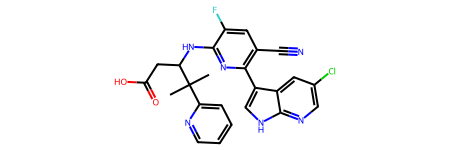

,SMILES,ROMol,id,InChIKey,InChI
0,CCOC(=O)CC(Nc1nc(-c2cn(S(=O)(=O)c3ccc(C)cc3)c3ncc(Cl)cc23)c(C#N)cc1F)C(C)(C)c1ccccn1,,7511bd679c1e7f5a3d5b735958ffd20d7a80adb8bb7910820d0b638ed29e64b2,OOZFMABEBBUICO-UHFFFAOYSA-N,"InChI=1S/C33H30ClFN6O4S/c1-5-45-29(42)16-28(33(3,4)27-8-6-7-13-37-27)39-31-26(35)14-21(17-36)30(40-31)25-19-41(32-24(25)15-22(34)18-38-32)46(43,44)23-11-9-20(2)10-12-23/h6-15,18-19,28H,5,16H2,1-4H3,(H,39,40)"
1,C=CCC(C)(C)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,e7fd0365d2d0199fc3e54f9df7e19e94ac4848831b119ad40d6d552e92d68899,LYYATYLUZJGCDK-UHFFFAOYSA-N,"InChI=1S/C22H21ClFN5O2/c1-4-5-22(2,3)17(8-18(30)31)28-21-16(24)6-12(9-25)19(29-21)15-11-27-20-14(15)7-13(23)10-26-20/h4,6-7,10-11,17H,1,5,8H2,2-3H3,(H,26,27)(H,28,29)(H,30,31)"
2,CC1(c2ccccn2)OC(=O)CC1Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,ae784eb91665bb5ba4f175c881820e7e266628a1606971ddda6b01cbe69e89d7,FSOJGKMHWDKDDD-UHFFFAOYSA-N,"InChI=1S/C23H16ClFN6O2/c1-23(17-4-2-3-5-27-17)18(8-19(32)33-23)30-22-16(25)6-12(9-26)20(31-22)15-11-29-21-14(15)7-13(24)10-28-21/h2-7,10-11,18H,8H2,1H3,(H,28,29)(H,30,31)"
3,COC(C)(C)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,c9b59137795645477143fc83732baf9b61b5fbc806fdaf2022d3be37f113ec72,DBQPQNQCCDXPJL-UHFFFAOYSA-N,"InChI=1S/C20H19ClFN5O3/c1-20(2,30-3)15(6-16(28)29)26-19-14(22)4-10(7-23)17(27-19)13-9-25-18-12(13)5-11(21)8-24-18/h4-5,8-9,15H,6H2,1-3H3,(H,24,25)(H,26,27)(H,28,29)"
4,CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,8c0bc6cdd814f5d6a393fbdb09bf49e911030c2e39bb48591079c3e89c49f8fb,JUPUMSRQQQUOLP-UHFFFAOYSA-N,"InChI=1S/C24H20ClFN6O2/c1-24(2,18-5-3-4-6-28-18)19(9-20(33)34)31-23-17(26)7-13(10-27)21(32-23)16-12-30-22-15(16)8-14(25)11-29-22/h3-8,11-12,19H,9H2,1-2H3,(H,29,30)(H,31,32)(H,33,34)"
5,CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3c(F)cc(F)cc23)c(C#N)cc1F,,43636b49368ac7627d2d84cba47293f35e0b21a17c80b20421de7a3ff8173e77,BDULCPMWVGWQHK-UHFFFAOYSA-N,"InChI=1S/C25H20F3N5O2/c1-25(2,19-5-3-4-6-30-19)20(10-21(34)35)32-24-18(28)7-13(11-29)22(33-24)16-12-31-23-15(16)8-14(26)9-17(23)27/h3-9,12,20,31H,10H2,1-2H3,(H,32,33)(H,34,35)"
6,CC(C)(c1cccs1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,69f1980ce37011979f9e58e70c86e9c0904af847e20c338603c54abe1b47f0b5,LGIQORBOBFGXRQ-UHFFFAOYSA-N,"InChI=1S/C23H19ClFN5O2S/c1-23(2,18-4-3-5-33-18)17(8-19(31)32)29-22-16(25)6-12(9-26)20(30-22)15-11-28-21-14(15)7-13(24)10-27-21/h3-7,10-11,17H,8H2,1-2H3,(H,27,28)(H,29,30)(H,31,32)"
7,CC(C)(c1nccs1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F,,9899dab978218884d677264246c62d0a7829b6ccde29491c1359dcc55aba9734,LDDCKJDRVHUHCL-UHFFFAOYSA-N,"InChI=1S/C22H18ClFN6O2S/c1-22(2,21-26-3-4-33-21)16(7-17(31)32)29-20-15(24)5-11(8-25)18(30-20)14-10-28-19-13(14)6-12(23)9-27-19/h3-6,9-10,16H,7H2,1-2H3,(H,27,28)(H,29,30)(H,31,32)"
8,Cn1ccc(C(C)(C)C(CC(=O)O)Nc2nc(-c3c[nH]c4ncc(Cl)cc34)c(C#N)cc2F)n1,,941884756ac97edc22448ba54190d5fb71a1356d8d5c49f26ef1758130c26c40,XTAGISJFBPOSCV-UHFFFAOYSA-N,"InChI=1S/C23H21ClFN7O2/c1-23(2,17-4-5-32(3)31-17)18(8-19(33)34)29-22-16(25)6-12(9-26)20(30-22)15-11-28-21-14(15)7-13(24)10-27-21/h4-7,10-11,18H,8H2,1-3H3,(H,27,28)(H,29,30)(H,33,34)"
9,CCCCC(Nc1nc(-c2cn(C)c3ncc(Cl)cc23)c(C#N)cc1F)C(C)(C)c1ccccn1,,4896c07eb660a82596f731d922f71043f9d280e93fee5ae06355805a11c0beb5,XSDZNJLLAHVOGO-UHFFFAOYSA-N,"InChI=1S/C27H28ClFN6/c1-5-6-9-23(27(2,3)22-10-7-8-11-31-22)33-25-21(29)12-17(14-30)24(34-25)20-16-35(4)26-19(20)13-18(28)15-32-26/h7-8,10-13,15-16,23H,5-6,9H2,1-4H3,(H,33,34)"

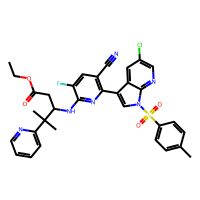
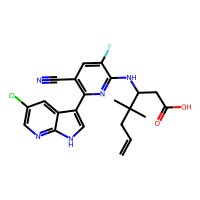
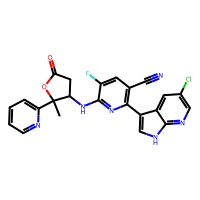
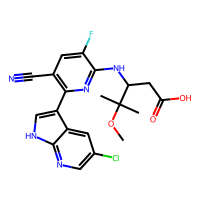
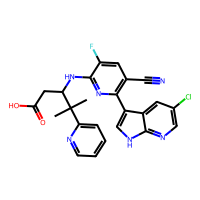
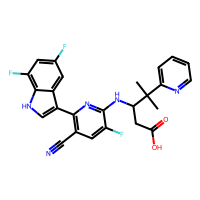
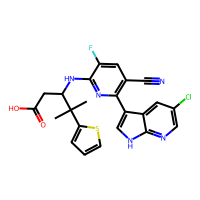
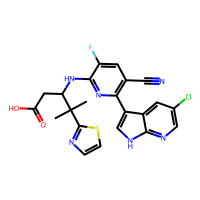
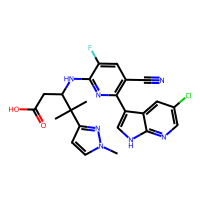
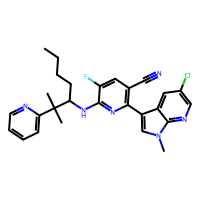

In [8]:
# define molecule
smiles_Molecule='CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F' 
# now substitute the variable into the %openad command
mols = %openad search for similar molecules to '{smiles_Molecule}'  
# then display the results
display(mols)

In [9]:
%openad search for patents ?
patents = %openad search for patents containing molecule '{smiles_Molecule}'
display(patents)


`search for patents containing molecule ['<smiles_molecule>'| '<inchi_molecule>'] [save as '<csv_file_name>']`<br><span style="color: #ccc">---------------------------------------------------------------------------</span><br>This command searches for mentions of a specified molecules in registered patents.<br>As input parameters you can provide either a SMILES version of a molecule <smiles_molecule> or Inchi <inchi_molecule>, which can either be in key or string format.<br><br> ` search for patents containing molecule 'CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F' ` <br><br>If you use the `SAVE AS` clause, it will save a csv file to the current workspace.

 ###   Patent Search Results for SMILES molecule: 

CC(C)(c1ccccn1)C(CC(=O)O)Nc1nc(-c2c[nH]c3ncc(Cl)cc23)c(C#N)cc1F

,PATENT ID
0,US10526338
1,JP2019505518T
2,CN108473493B
3,US20190023713


 <h3>  Molecules Mentioned in listed Patents: </h3>

US10526338 / JP2019505518T / CN108473493B / US20190023713

,SMILES,ROMol,id,InChIKey,InChI
0,CCC(=O)C=C(N)C(C)(C)c1nccs1,,4fc21f22f8a1856e91fdd3d8fe00e92159e2fb969c0e2c51472a5bb785126363,KMIAWKKUQRCIHO-UHFFFAOYSA-N,"InChI=1S/C11H16N2OS/c1-4-8(14)7-9(12)11(2,3)10-13-5-6-15-10/h5-7H,4,12H2,1-3H3"
1,CCOC(=O)CC(Nc1nc(-c2cn(S(=O)(=O)c3ccc(C)cc3)c3ncc(Cl)cc23)c(C#N)cc1F)C(C)(C)C,,e257099207164f831ea93b17a4238a4f5cb957af7a3a8eac1b7720f5416b32c2,WEGYKZHLKNBWKN-UHFFFAOYSA-N,"InChI=1S/C29H29ClFN5O4S/c1-6-40-25(37)13-24(29(3,4)5)34-27-23(31)11-18(14-32)26(35-27)22-16-36(28-21(22)12-19(30)15-33-28)41(38,39)20-9-7-17(2)8-10-20/h7-12,15-16,24H,6,13H2,1-5H3,(H,34,35)"
2,CCOC(=O)CC(=O)C(C)(C)c1ccccn1,,57e4a930890c3b225db07946488920c859e1ce7b0b2e2a6e6e91e4e1cee8a728,SXQTZDZFELNJFF-UHFFFAOYSA-N,"InChI=1S/C13H17NO3/c1-4-17-12(16)9-11(15)13(2,3)10-7-5-6-8-14-10/h5-8H,4,9H2,1-3H3"
3,CCOC(=O)CC(N)C(C)(C)c1ccccn1,,4528f70803af628a92e1055d43369e62efdec51d80d7483c831c61b8352de97b,YSJJRYJLMJLXLU-UHFFFAOYSA-N,"InChI=1S/C13H20N2O2/c1-4-17-12(16)9-10(14)13(2,3)11-7-5-6-8-15-11/h5-8,10H,4,9,14H2,1-3H3"
4,CCOC(=O)CCC(Nc1nc(Cl)ncc1F)C1(C)COC1,,286953f6ae0c44b4ff04777be447a390ba9ffbf957fbb7b2cbbb47c2608df42e,JNSIVARBFBYVSV-UHFFFAOYSA-N,"InChI=1S/C14H19ClFN3O3/c1-3-22-11(20)5-4-10(14(2)7-21-8-14)18-12-9(16)6-17-13(15)19-12/h6,10H,3-5,7-8H2,1-2H3,(H,17,18,19)"
5,CCOC(=O)CCC(N)C(C)(C)c1cccs1,,1a52c637721f28a20d0d23ac6208f466fd43fdae70b0828cc0584004857869cc,IUXNUHKUQBHZFA-UHFFFAOYSA-N,"InChI=1S/C13H21NO2S/c1-4-16-12(15)8-7-10(14)13(2,3)11-6-5-9-17-11/h5-6,9-10H,4,7-8,14H2,1-3H3"
6,CCOC(=O)CC(Nc1nc(Cl)c(C#N)cc1F)C(C)(C)OC,,8978ccaa57e7e332c2afc82a66037b22ccfd49e706b3b569cd492fa37ce0fd49,QLVTXQIPAIEYRY-UHFFFAOYSA-N,"InChI=1S/C15H19ClFN3O3/c1-5-23-12(21)7-11(15(2,3)22-4)19-14-10(17)6-9(8-18)13(16)20-14/h6,11H,5,7H2,1-4H3,(H,19,20)"
7,CC1(C(CC2C34C5C3C254)Nc2nc(Cl)ncc2F)COC1,,fb232b8dc4c7e59781f115d10a073596df4bd5ebaf272f392a48883e1a8ff077,ULKLMNDGUMDVTK-UHFFFAOYSA-N,"InChI=1S/C15H15ClFN3O/c1-13(4-21-5-13)8(2-7-14-9-10(14)15(7,9)14)19-11-6(17)3-18-12(16)20-11/h3,7-10H,2,4-5H2,1H3,(H,18,19,20)"
8,CCOC(=O)CC(Nc1nc(-c2cn(S(=O)(=O)c3ccc(C)cc3)c3ncc(Cl)cc23)c(C#N)cc1F)C(C)(C)c1ccccn1,,7511bd679c1e7f5a3d5b735958ffd20d7a80adb8bb7910820d0b638ed29e64b2,OOZFMABEBBUICO-UHFFFAOYSA-N,"InChI=1S/C33H30ClFN6O4S/c1-5-45-29(42)16-28(33(3,4)27-8-6-7-13-37-27)39-31-26(35)14-21(17-36)30(40-31)25-19-41(32-24(25)15-22(34)18-38-32)46(43,44)23-11-9-20(2)10-12-23/h6-15,18-19,28H,5,16H2,1-4H3,(H,39,40)"
9,CCOC(=O)C=C([N+](=O)[O-])C(C)(C)c1ccccn1,,6cfb6f59520c4f9a979787abc764bc8e98df497aee19706a6ddfb675cdec66fd,UNFKXHHHLBELIF-UHFFFAOYSA-N,"InChI=1S/C13H16N2O4/c1-4-19-12(16)9-11(15(17)18)13(2,3)10-7-5-6-8-14-10/h5-9H,4H2,1-3H3"

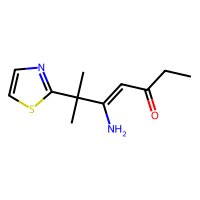
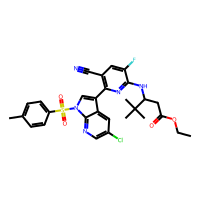
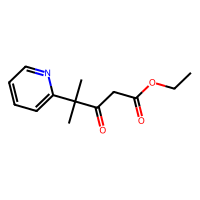
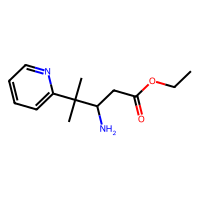
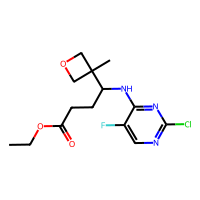
...
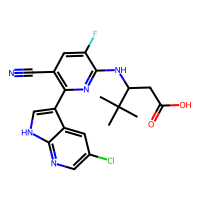
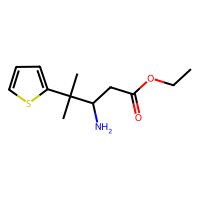
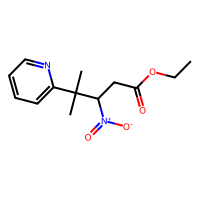
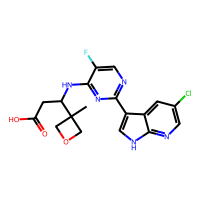
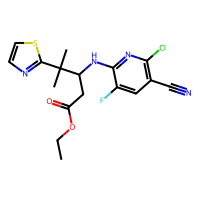

In [10]:
mylist = list(patents['PATENT ID'])
myframe =  %openad search for molecules in patents from list {mylist}
display(myframe)

<br> File successfully saved to workspace.

 ###   Search Results for smiles containing substructures of :  

C1(C(=C)C([O-])C1C)=O

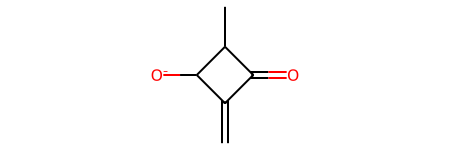

,SMILES,ROMol,id,InChIKey,InChI
0,CCCCC1=CC(=CC2C(=O)C(=CC3=CC(CCCC)=[SH]C(CCCC)=C3)C2[O-])C=C(CCCC)S1,,d9cbfa339426a674cb06ce2c6a87cbae05bc5b75ce47ef179f611359e9f1df5c,XXGPLCYSAQELLI-UHFFFAOYSA-N,"InChI=1S/C32H44O2S2/c1-5-9-13-25-17-23(18-26(35-25)14-10-6-2)21-29-31(33)30(32(29)34)22-24-19-27(15-11-7-3)36-28(20-24)16-12-8-4/h17-22,29,31H,5-16H2,1-4H3/q-1"
1,CC(C)(C)C1=CC(=CC2C(=O)C(=Cc3cc(C(C)(C)C)[s+]c(C(C)(C)C)c3)C2[O-])C=C(C(C)(C)C)S1,,79737dd0324b2a52b5882b6f9bf149d649643a7ff64f1f35943335afb33df2f3,VQFOAQDIMQQLQS-UHFFFAOYSA-N,"InChI=1S/C32H44O2S2/c1-29(2,3)23-15-19(16-24(35-23)30(4,5)6)13-21-27(33)22(28(21)34)14-20-17-25(31(7,8)9)36-26(18-20)32(10,11)12/h13-18,21,27H,1-12H3"
2,C=CC(=O)Oc1ccc2c(c1)C(C)(C)C(=CC1C(=O)C(=CC3=[N+](C)c4ccccc4C3(C)C)C1[O-])N2C,,34793375e992975acc6cef5465857c2494d2747082333ec29634d6fb31337b83,GIHHERJCBDYHSR-UHFFFAOYSA-N,"InChI=1S/C31H32N2O4/c1-8-27(34)37-18-13-14-24-22(15-18)31(4,5)26(33(24)7)17-20-28(35)19(29(20)36)16-25-30(2,3)21-11-9-10-12-23(21)32(25)6/h8-17,20,28H,1H2,2-7H3"
3,O=C1C(=Cc2ccc3ccccc3[nH+]2)C([O-])C1C=C1C=Cc2ccccc2N1,,3a82145b76f9c22961d37c944a7481e6897ff416503d372977848bfee6c95bf8,RSGJUKWJZPCFLH-UHFFFAOYSA-O,"InChI=1S/C24H17N2O2/c27-23-19(13-17-11-9-15-5-1-3-7-21(15)25-17)24(28)20(23)14-18-12-10-16-6-2-4-8-22(16)26-18/h1-14,19,23,25H/q-1/p+1"
4,CCN1C=CC2=C(C3C(=O)C(=C4CCc5c(C(F)(F)F)ccc6c5c4cc[n+]6CC)C3[O-])CCc3c(C(F)(F)F)ccc1c32,,6089b13fd30070055063a50290afe84dee51983a08af585f4dd767b4f7eacf1e,ONRTVSLPISLYNK-UHFFFAOYSA-N,"InChI=1S/C34H28F6N2O2/c1-3-41-15-13-19-17(5-7-21-23(33(35,36)37)9-11-25(41)27(19)21)29-31(43)30(32(29)44)18-6-8-22-24(34(38,39)40)10-12-26-28(22)20(18)14-16-42(26)4-2/h9-16,29,31H,3-8H2,1-2H3"
5,CC1=CC(=C2C(=O)C(C3=CC(C)C4C=C(C(C)C)C=CC(C)=C34)C2[O-])C23CC2(C)CCC(C(C)C)CC13,,c4e8d69feb902031701ec36a41c53305054aaa97c8e7c019ed05106b9b0fb46b,KCMWXDARQBXSJJ-UHFFFAOYSA-N,"InChI=1S/C35H45O2/c1-18(2)23-10-9-20(5)29-25(15-23)21(6)13-26(29)30-32(36)31(33(30)37)28-14-22(7)27-16-24(19(3)4)11-12-34(8)17-35(27,28)34/h9-10,13-15,18-19,21,24-25,27,30,32H,11-12,16-17H2,1-8H3/q-1"
6,CC[N+](C)=C1C=CC(=CC2C(=O)C(=Cc3ccc(N(C)C)cc3)C2[O-])C=C1,,d9a1ff39a24f06a3fe548226f907ce87bea73aa935eff588b9a97cc73aaa4d04,TUDATTWGCVYNIQ-UHFFFAOYSA-N,"InChI=1S/C23H26N2O2/c1-5-25(4)19-12-8-17(9-13-19)15-21-22(26)20(23(21)27)14-16-6-10-18(11-7-16)24(2)3/h6-15,21-22H,5H2,1-4H3"
7,CC1=CC(=C2C(=O)C(C3=CC(C)C4C=C(C(C)C)C=CC(C)=C34)C2[O-])C2C(C)CCC(C(C)C)CC12,,46833bd401c828f248ebc9d4fed243336c35f6106ba6d8bef3f063d803b66b25,FWTIANVNFZWEKK-UHFFFAOYSA-N,"InChI=1S/C34H45O2/c1-17(2)23-11-9-19(5)29-25(15-23)21(7)13-27(29)31-33(35)32(34(31)36)28-14-22(8)26-16-24(18(3)4)12-10-20(6)30(26)28/h9,11,13-15,17-18,20-21,24-26,30-31,33H,10,12,16H2,1-8H3/q-1"
8,CCN1C=CC(=CC2C(=O)C(=Cc3cc[n+](CC)c4ccc(C(F)(F)F)cc34)C2[O-])c2cc(C(F)(F)F)ccc21,,4f9ad3eed833c91f4c55bf97cff1a191d6bbb46cbbab6da4a81bab22585bdb0a,BKCNAQMLVJUTEL-UHFFFAOYSA-N,"InChI=1S/C30H24F6N2O2/c1-3-37-11-9-17(21-15-19(29(31,32)33)5-7-25(21)37)13-23-27(39)24(28(23)40)14-18-10-12-38(4-2)26-8-6-20(16-22(18)26)30(34,35)36/h5-16,23,27H,3-4H2,1-2H3"
9,C[N+](C)=C1C=CC(=C2C(=O)C(C=C(C#N)C(N)=O)C2[O-])C=C1,,ca2d4e22cfb434fd901ee57d4f8e03c7d20192fa7bafba67d7e2474fe86305ce,VLXJZKUKHYSNOA-UHFFFAOYSA-N,"InChI=1S/C16H15N3O3/c1-19(2)11-5-3-9(4-6-11)13-14(20)12(15(13)21)7-10(8-17)16(18)22/h3-7,12,14H,1-2H3,(H2,18,22)"

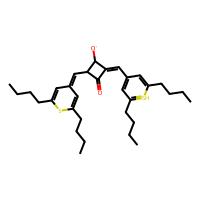
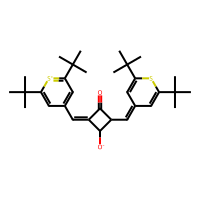
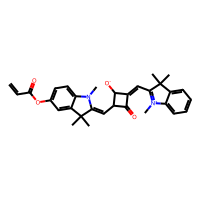
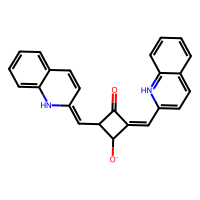
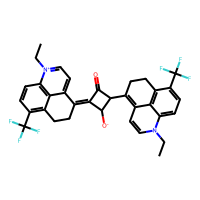
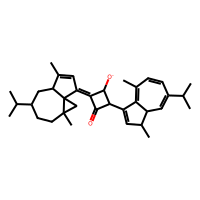
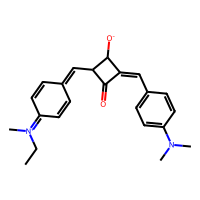
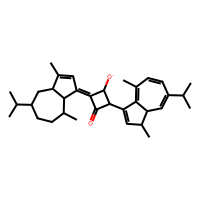
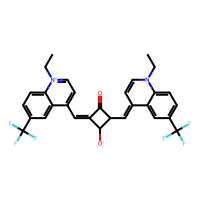
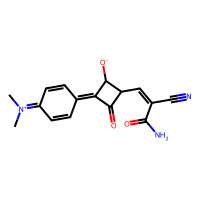

In [11]:
%openad search for substructure instances of 'C1(C(=C)C([O-])C1C)=O' save as 'my_mol'

In [12]:
%openad search collection 'pubchem' for 'Ibuprofen' SHOW (data) 

<br> Expected Results Estimate: 9

  0%|          | 0/1 [00:00<?, ?it/s]

,cid,cas_number,ec_number,SMILES,chemical_name,molecular weight,xlogp3,hydrogen bond donor count,hydrogen bond acceptor count,rotatable bond count,exact mass,monoisotopic mass,topological polar surface area,heavy atom count,formal charge,complexity,isotope atom count,defined atom stereocenter count,undefined atom stereocenter count,covalently-bonded unit count,compound is canonicalized
0,114864,51146-57-7,610-621-4,CC(C)CC1=CC=C(C=C1)C(C)C(=O)O,(-)-ibuprofen,206.280000,3.500000,1.000000,2.000000,4.000000,206.130680,206.130680,37.300000,15.000000,0.000000,203.000000,0.000000,1.000000,0.000000,1.000000,Yes
1,175781,98207-12-6,,CC(C)CC1=CC=C(C=C1)C(C)C(=O)OCCN2CCN(CC2)C3=CC(=CC=C3)Cl,Lobuprofen,429.000000,6.100000,0.000000,4.000000,9.000000,428.223056,428.223056,32.800000,30.000000,0.000000,513.000000,0.000000,0.000000,1.000000,1.000000,Yes
2,39912,51146-56-6,,CC(C)CC1=CC=C(C=C1)C(C)C(=O)O,Dexibuprofen,206.280000,3.500000,1.000000,2.000000,4.000000,206.130680,206.130680,37.300000,15.000000,0.000000,203.000000,0.000000,1.000000,0.000000,1.000000,Yes
3,219068,17692-38-5,,CC(C1=CC=C(C=C1)C2=CC(=CC=C2)F)C(=O)O,Fluprofen,244.260000,3.700000,1.000000,3.000000,3.000000,244.089958,244.089958,37.300000,18.000000,0.000000,284.000000,0.000000,0.000000,1.000000,1.000000,Yes
4,3672,79261-49-7 (potassium salt),239-784-6,CC(C)CC1=CC=C(C=C1)C(C)C(=O)O,Ibuprofen,206.280000,3.500000,1.000000,2.000000,4.000000,206.130680,206.130680,37.300000,15.000000,0.000000,203.000000,0.000000,0.000000,1.000000,1.000000,Yes
5,68769,57144-56-6,,CC(C)C1CC2=C(C1)C=C(C=C2)C(C)C(=O)O,Isoprofen,232.320000,3.800000,1.000000,2.000000,3.000000,232.146330,232.146330,37.300000,17.000000,0.000000,285.000000,0.000000,0.000000,2.000000,1.000000,Yes
6,5359,40828-46-4,255-096-9,CC(C1=CC=C(C=C1)C(=O)C2=CC=CS2)C(=O)O,Suprofen,260.310000,3.300000,1.000000,4.000000,4.000000,260.050715,260.050715,82.600000,18.000000,0.000000,321.000000,0.000000,0.000000,1.000000,1.000000,Yes
7,595160,36039-36-8,,CC(C)CC1=CC=C(C=C1)C(C)CO,Ibuprofen alcohol,192.300000,3.400000,1.000000,1.000000,4.000000,192.151415,192.151415,20.200000,14.000000,0.000000,145.000000,0.000000,0.000000,1.000000,1.000000,Yes
8,71261,83394-44-9,280-048-9,CC(C)CC1=CC=C(C=C1)C(C)C(=O)NCCO,Mabuprofen,249.350000,2.600000,2.000000,2.000000,6.000000,249.172879,249.172879,49.300000,18.000000,0.000000,245.000000,0.000000,0.000000,1.000000,1.000000,Yes


In [13]:
%openad search collection 'arXiv abstracts' for ' " carbon capture" AND "membrane" ' using (  page_size=10 edit_distance=5 ) show (data docs)  

<br> Expected Results Estimate: 2

  0%|          | 0/1 [00:00<?, ?it/s]

<h3>Distribution of Returned Documents by Year</h3>

,2019,2020
0,3,3


,Title,Authors,Snippet,arxivid,doi,Report,Field
0,Electrolytic Conversion of Bicarbonate into CO in a Flow Cell,"Tengfei Li,Eric W. Lees,Maxwell Goldman,Danielle A. Salvatore,David M. Weekes,Curtis P. Berlinguette",This process offers a means of using electrolysis to bypass the thermally-intensive step of extracting CO2 from bicarbonate solutions generated in carbon capture schemes.,https://arxiv.org/abs/1905.04580,https://doi.org/10.1016/j.joule.2019.05.021,1905.04580,main-text.text
1,Carbon Capture and Separation from CO2/N2/H2O Gaseous Mixtures in Bilayer Graphtriyne: A Molecular Dynamics Study,"Noelia Faginas-Lago,Yusuf Bramastya Apriliyanto,Andrea Lombardi",We also observed that the bilayer graphtriyne membrane has high CO2 and H2O permeances compared to N2 with permeance selectivity ranging from 4.8 to 6.5.,https://arxiv.org/abs/2008.01754,,2008.01754,main-text.text


In [14]:
%openad get status

Current workspace: DEFAULT<br>Current context: DS4SD<br><span style="color: #ccc">To see more details, run `get workspace` or `get context`.</span>

### RXN ###

In [15]:
%openad remove toolkit gt4sd

<span style="color: red">Action aborted</span><br><span style="color: #ccc">Run `clear sessions` and try again</span>

In [16]:
%openad add toolkit gt4sd

<span style="color: red">Action aborted</span><br><span style="color: #ccc">Run `clear sessions` and try again</span>

In [17]:
%openad set context gt4sd

<span style="color: green">You successfully logged in to GT4SD</span><br><span style="color: #ccc">Your access token expires on (Expiration date goes here)</span>

In [18]:
%openad set workspace default

<span style="color: orange">You already are in the DEFAULT workspace</span>

In [19]:
%openad add toolkit rxn
%openad set context rxn
%openad List rxn models

<span style="color: red">Action aborted</span><br><span style="color: #ccc">Run `clear sessions` and try again</span>

<span style="color: green">logging into RXN as: </success> phil.downey1@ibm.com<br> <success>Workspace: </span> DEFAULT

RXN Project has been set to DEFAULT for this Workspace

<span style="color: green">You successfully logged in to RXN</span><br><span style="color: #ccc">Your access token does not have an expiration date</span>

Models,versions
paragraph-to-actions,[2020-07-17]
sequence-to-actions,[2020-10-20]
reaction-prediction-model,"[2018-08-31, 2020-08-10]"
retrosynthesis-prediction-model,"[12class-tokens-2021-05-14, 2019-09-12, 2020-04-24, 2020-07-01, 2020-07-31, aizynth-2020-06-11, disconnection-aware-2022-06-24, enzymatic-2021-04-16, enzymatic-2022-05-31, sulfonium-2020-10-27]"


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

<span style="color: green">Target Molecule:</span> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

Output()

Output()

###  Showing path  0  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

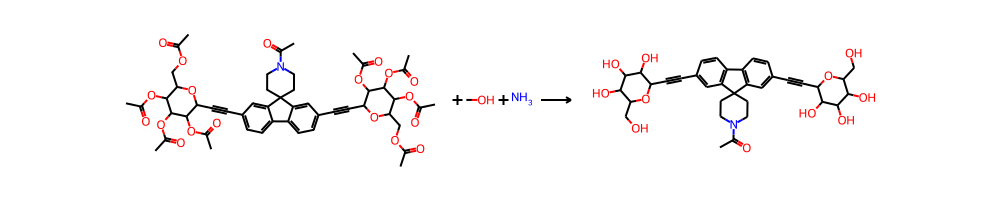

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

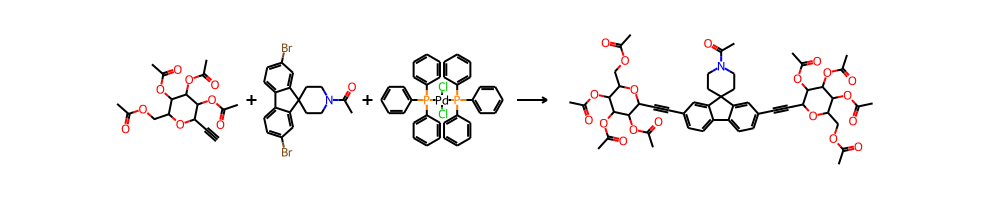

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

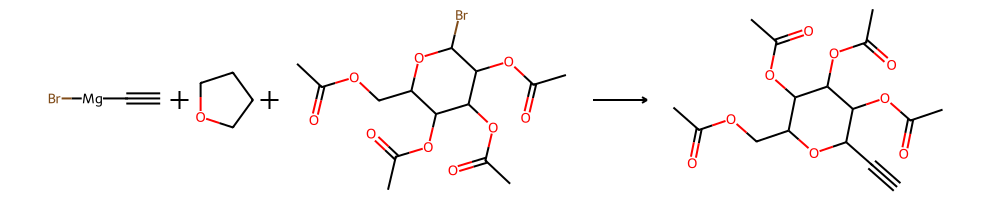

###  Showing path  1  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

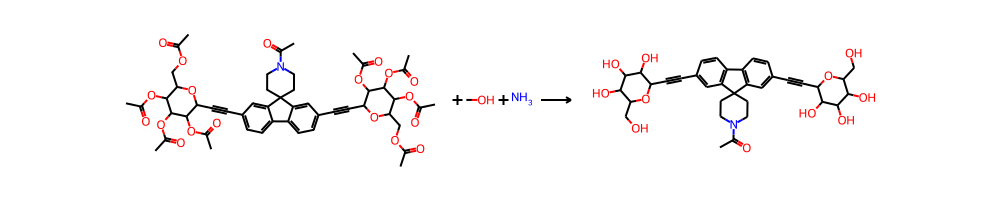

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

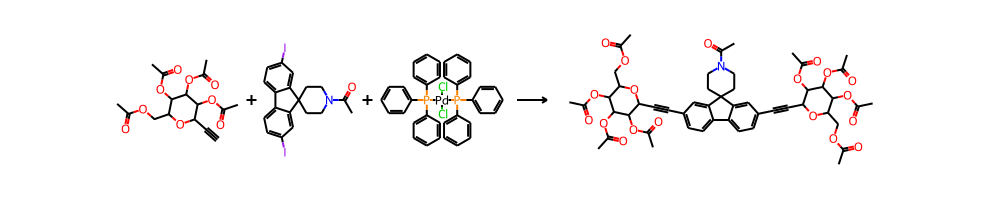

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

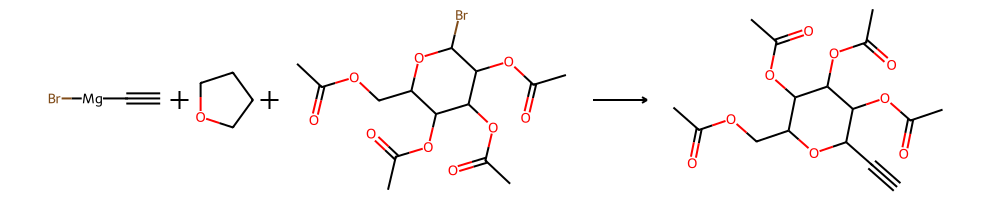

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

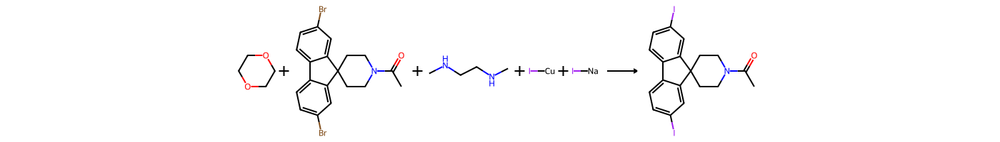

###  Showing path  2  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

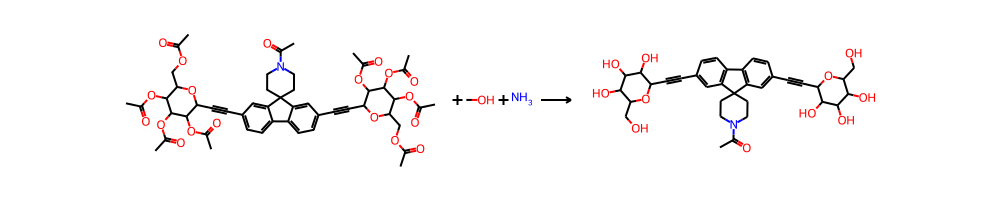

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

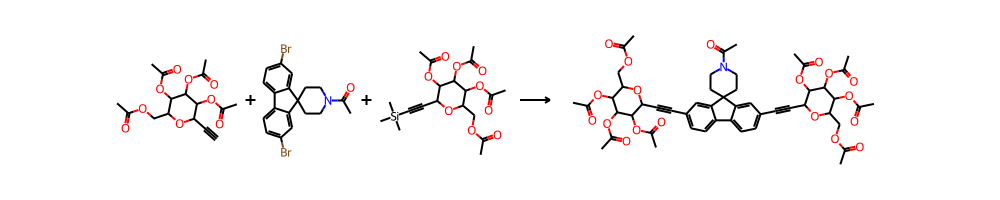

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

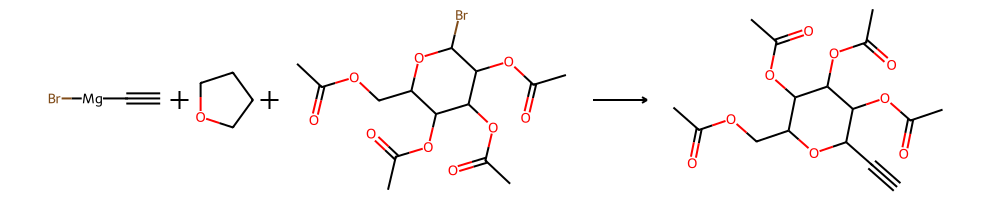

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

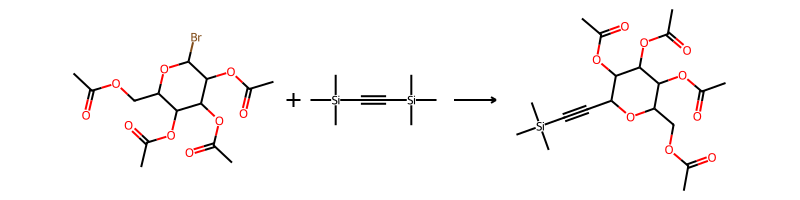

###  Showing path  3  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

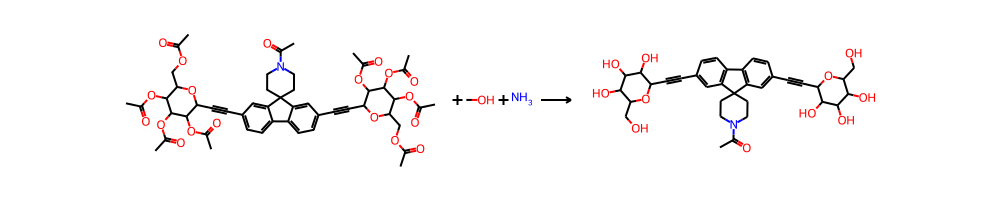

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

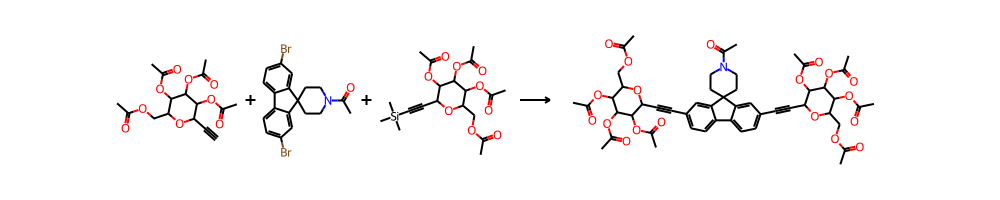

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

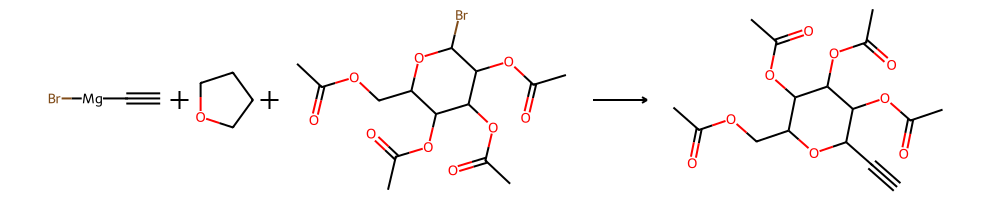

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

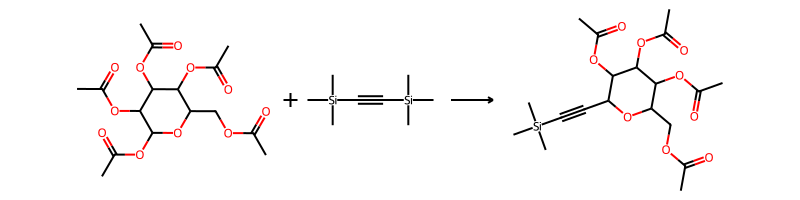

###  Showing path  4  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

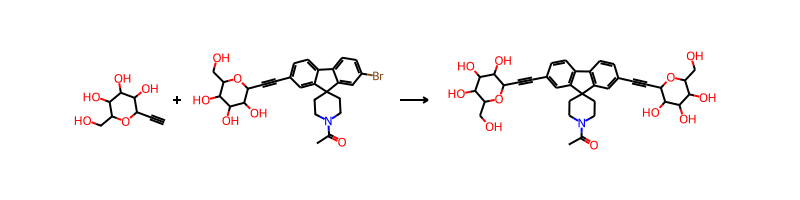

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

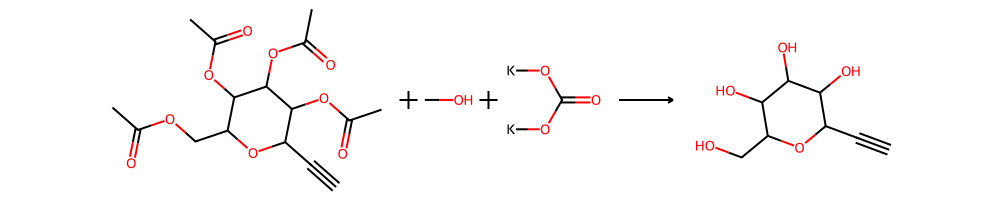

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

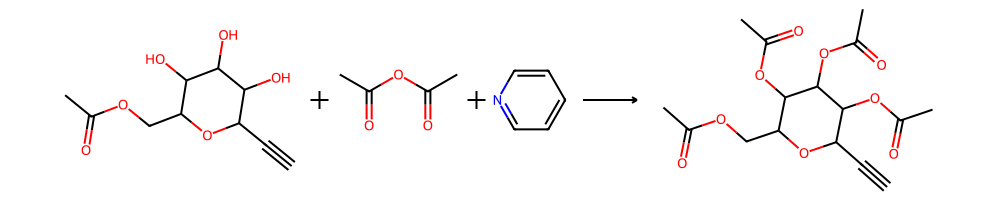

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

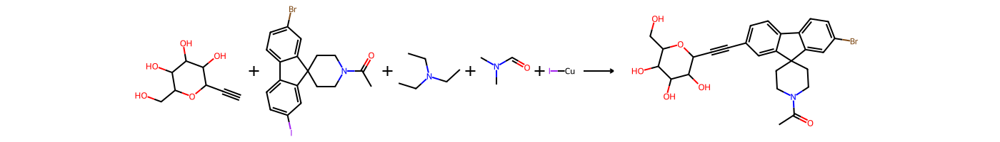

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

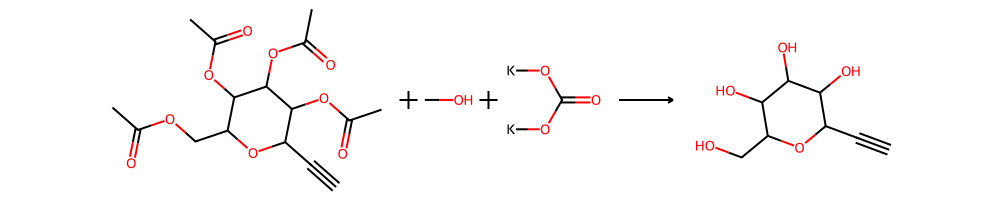

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

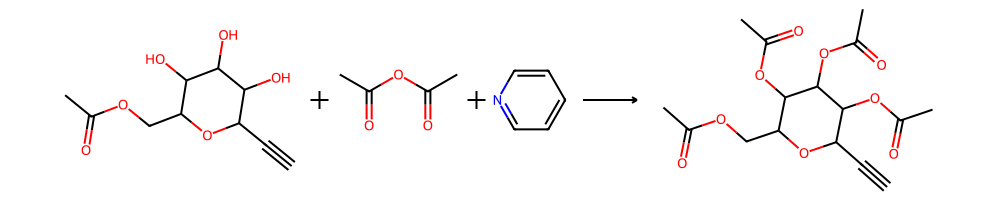

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

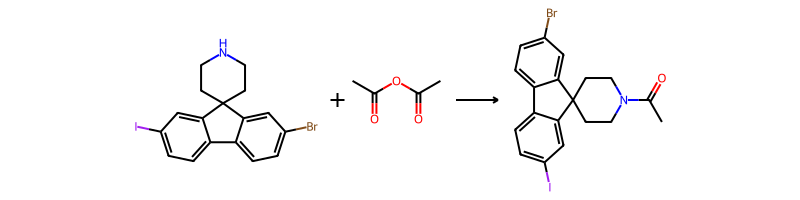

###  Showing path  5  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

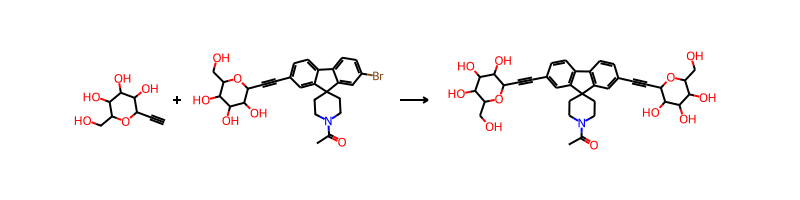

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

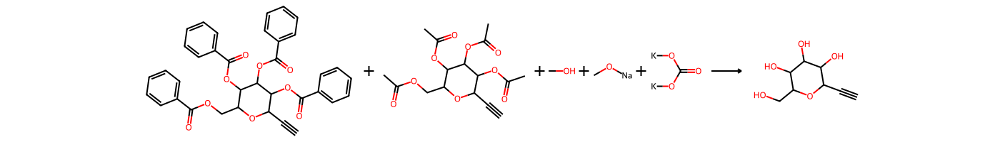

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

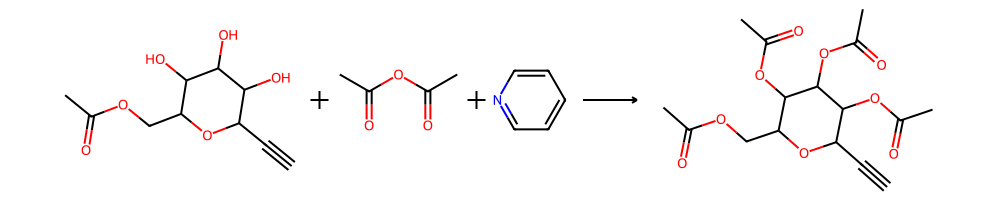

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

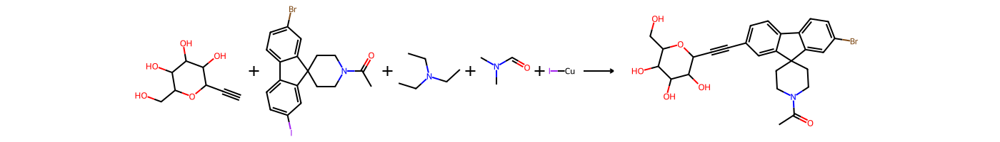

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

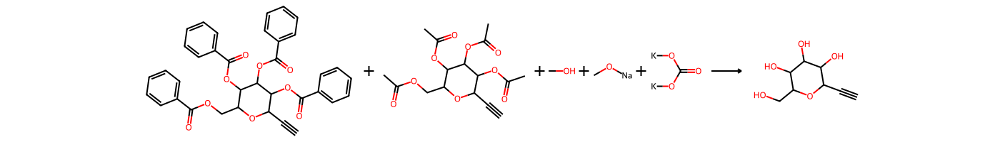

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

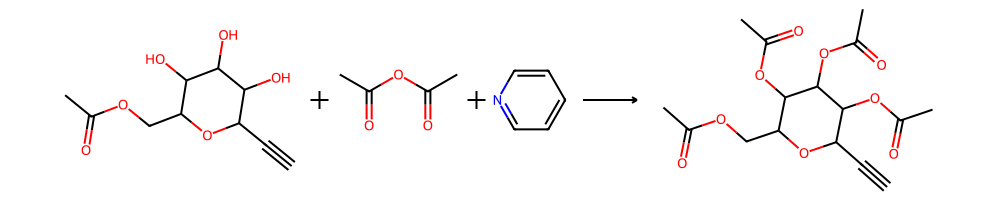

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

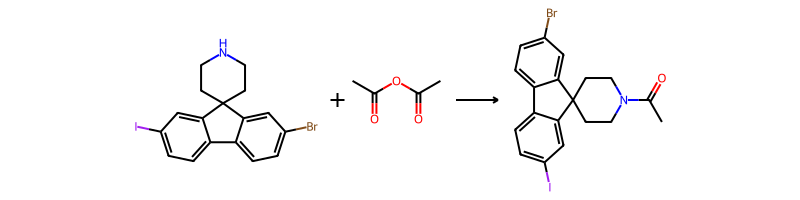

###  Showing path  6  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

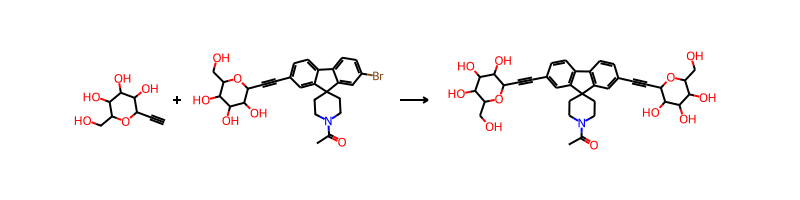

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

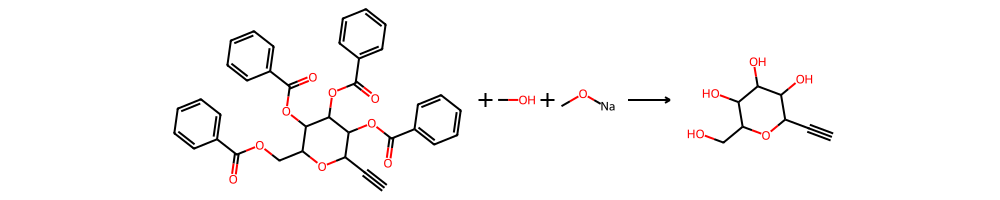

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

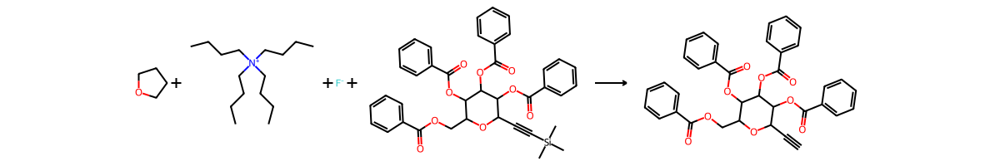

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

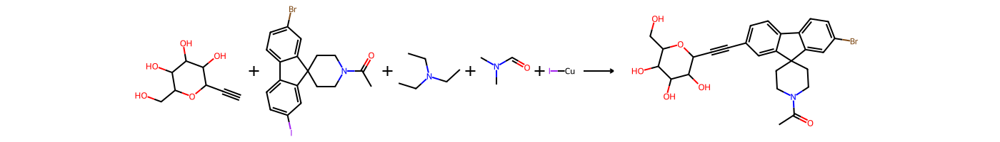

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

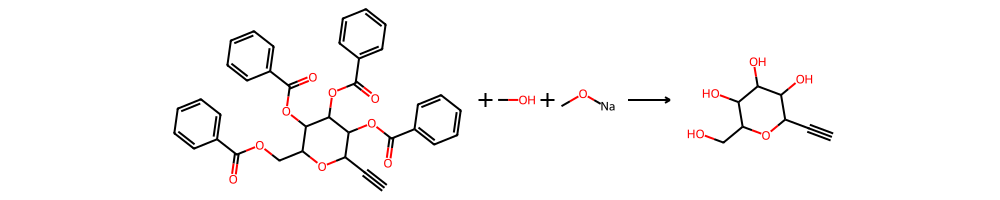

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

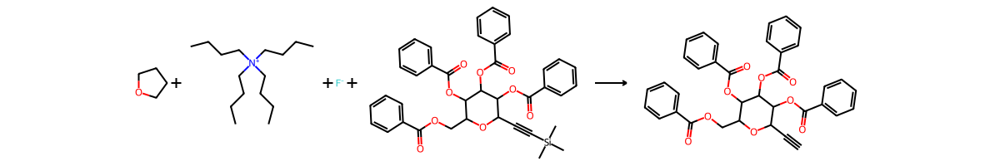

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

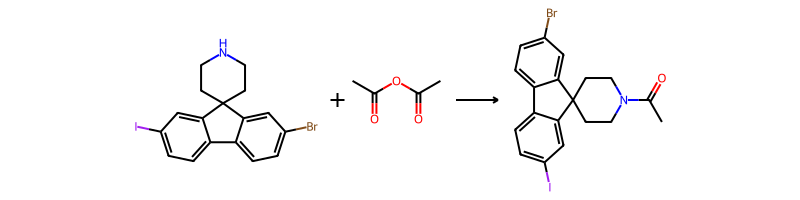

###  Showing path  7  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

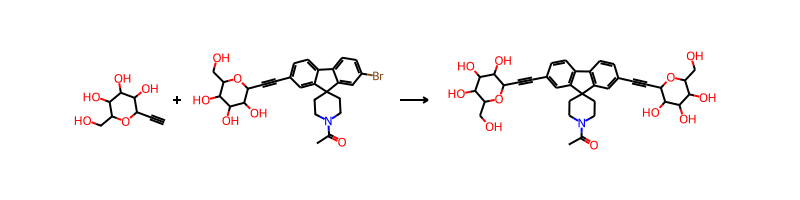

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

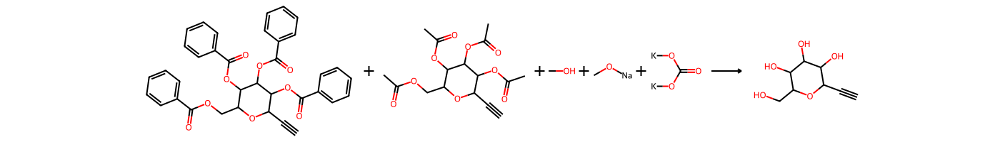

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

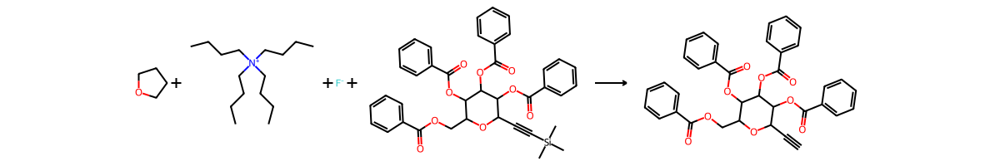

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

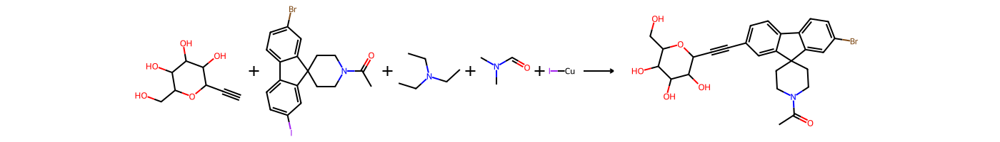

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

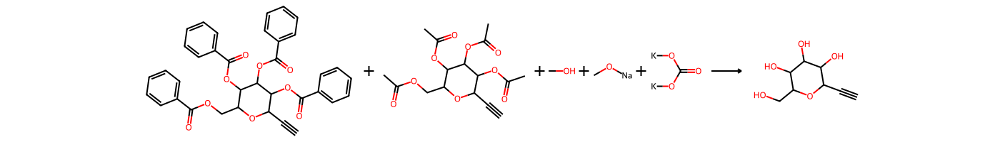

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

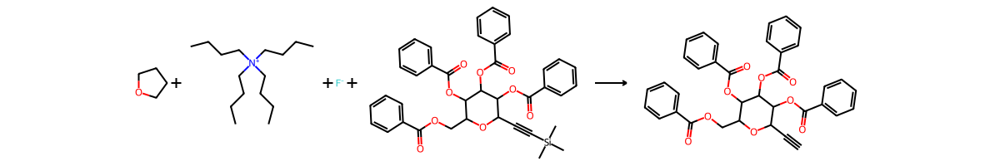

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

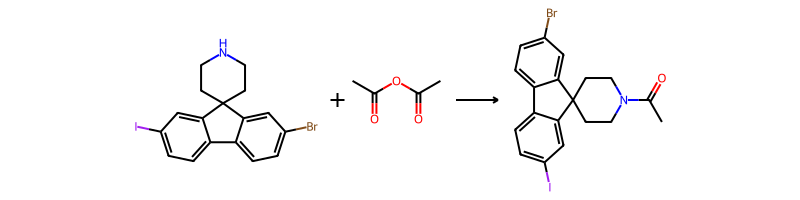

###  Showing path  8  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

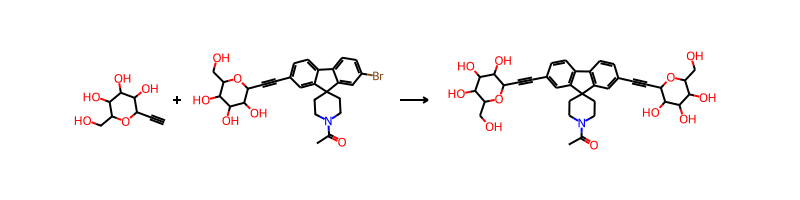

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

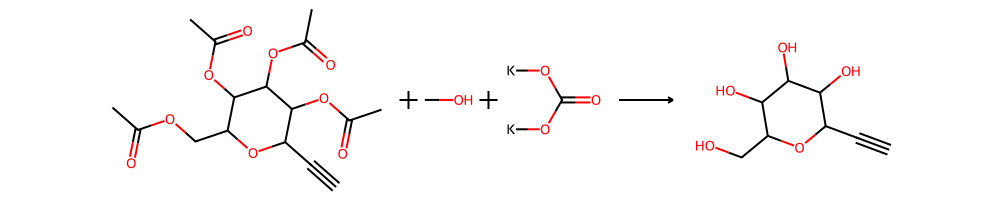

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

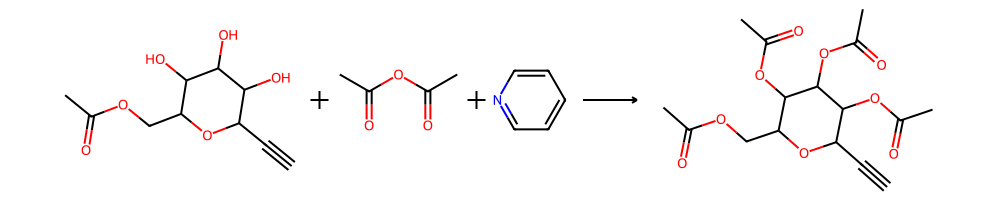

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

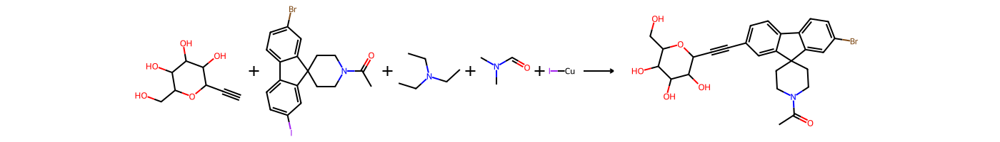

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

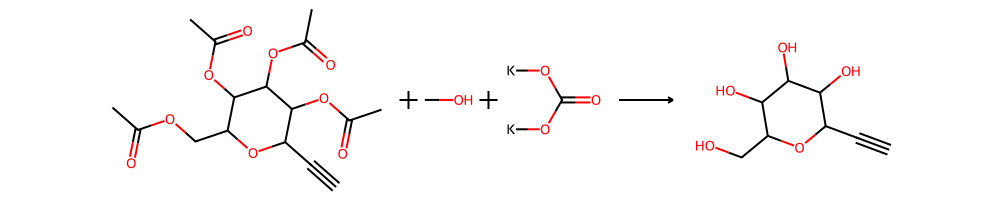

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

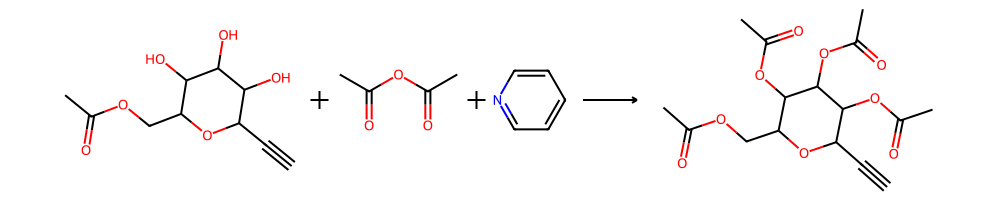

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

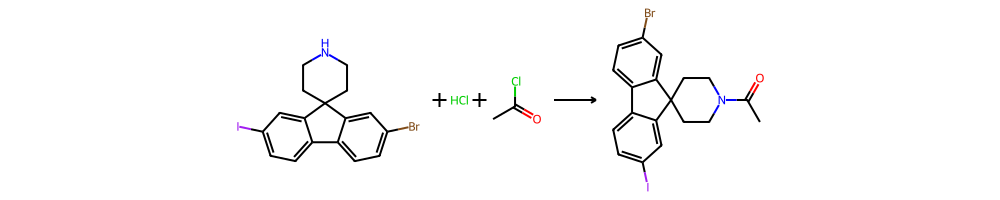

###  Showing path  9  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

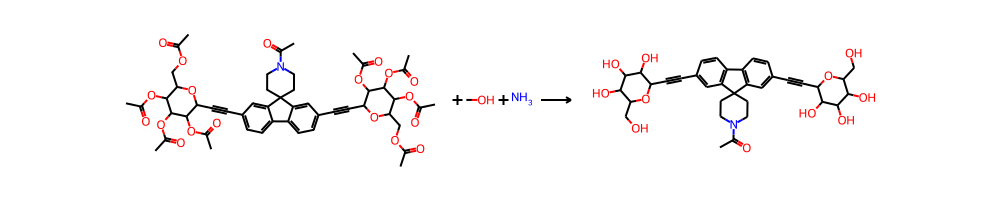

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

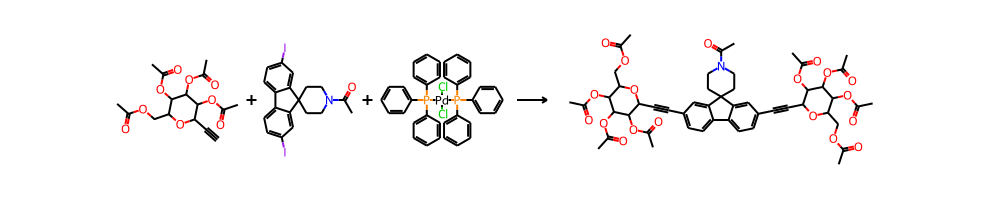

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

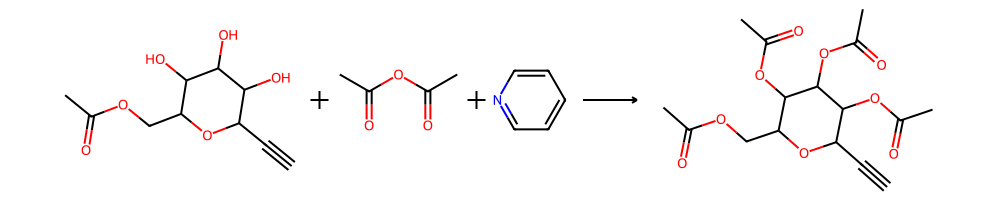

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

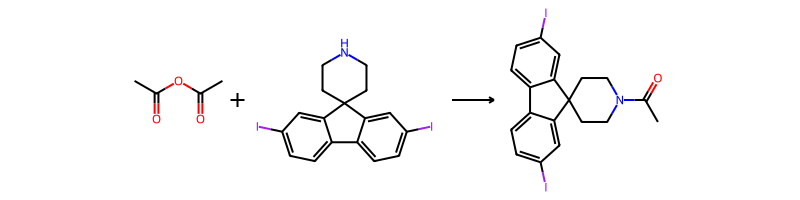

###  Showing path  10  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

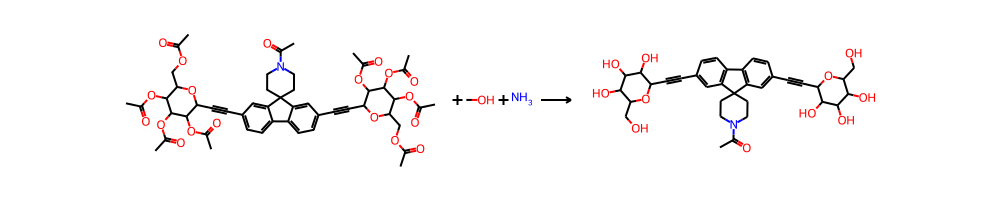

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

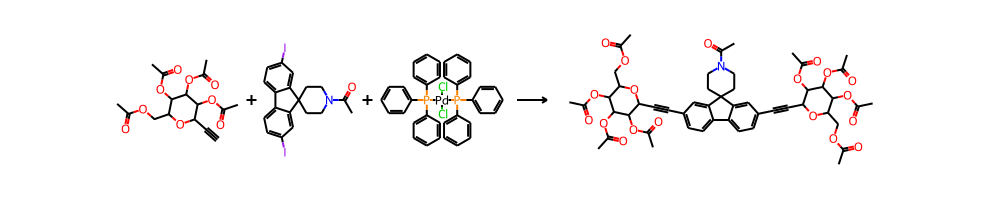

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

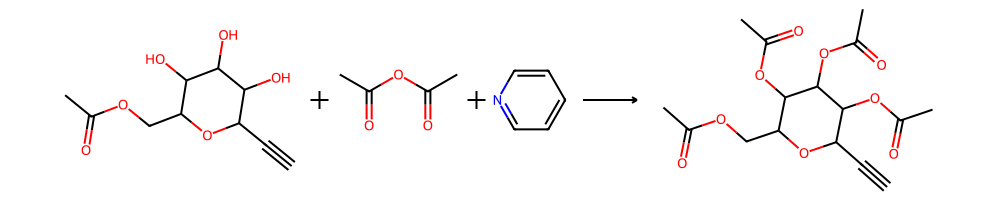

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

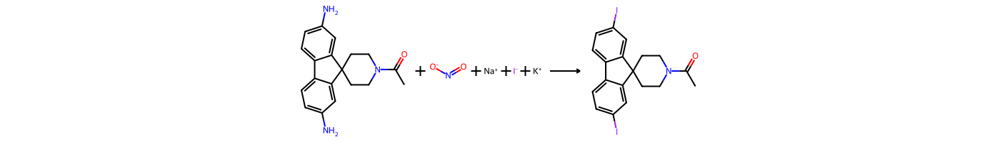

###  Showing path  11  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

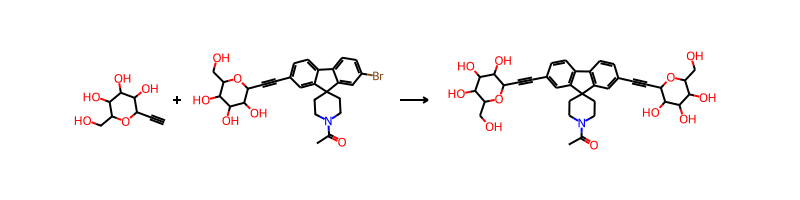

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

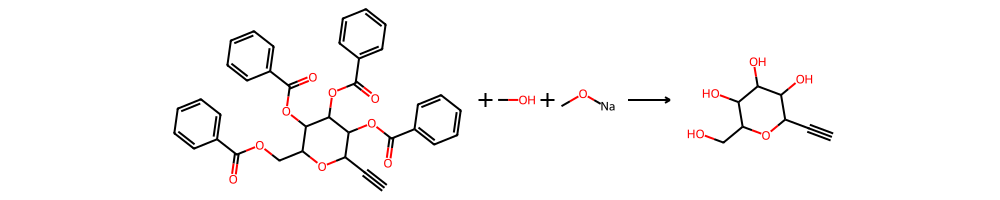

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

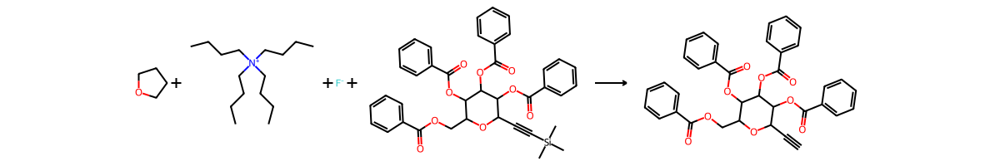

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

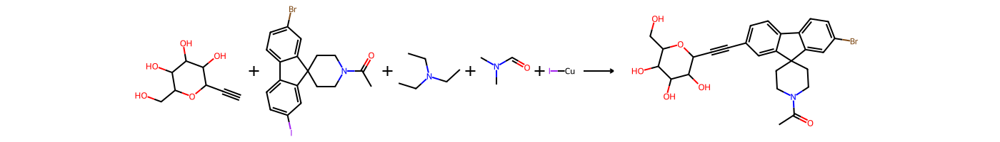

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

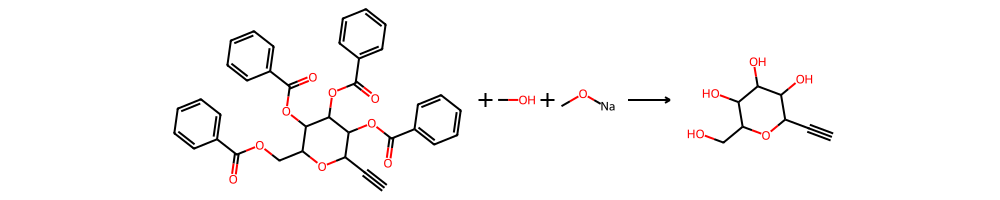

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

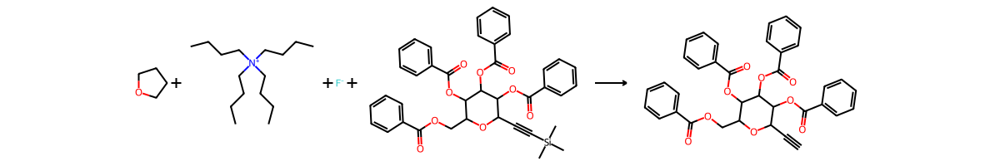

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

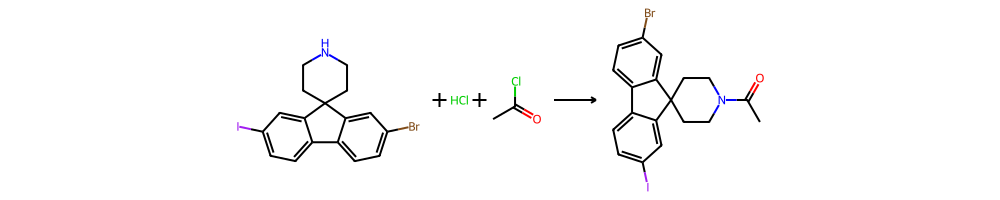

###  Showing path  12  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

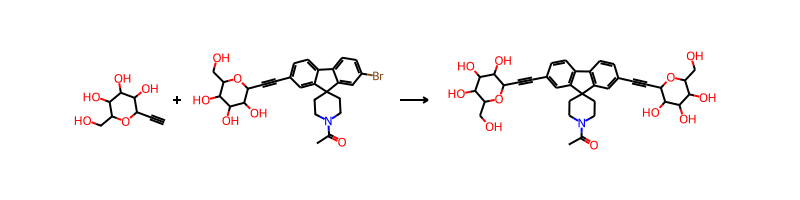

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

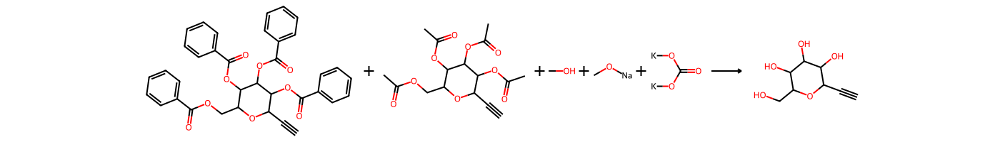

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

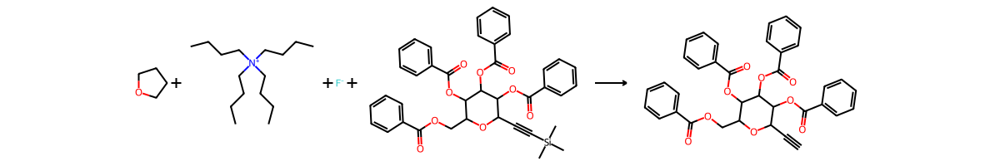

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

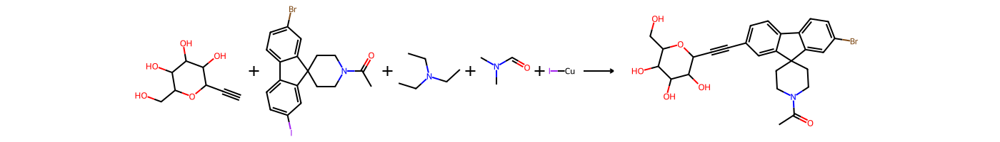

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

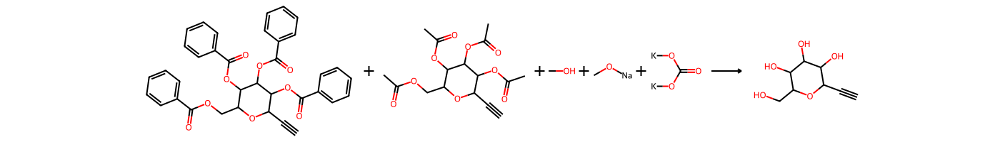

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

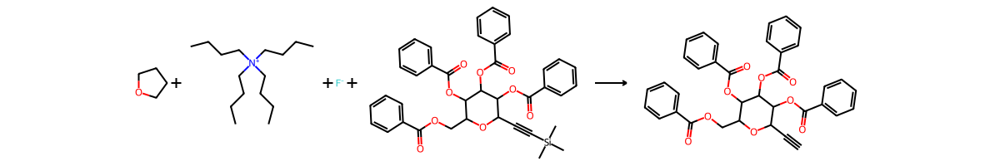

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

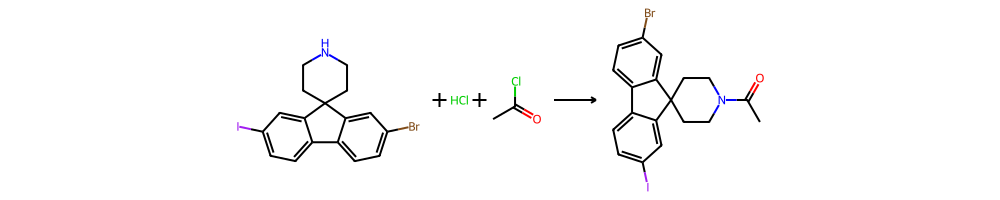

###  Showing path  13  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

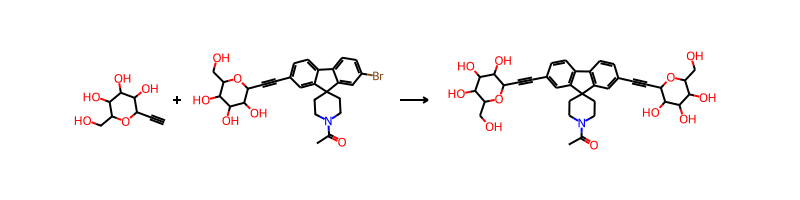

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

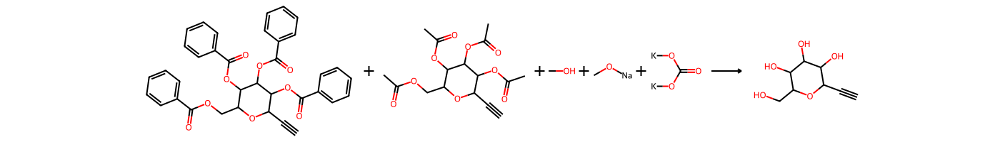

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

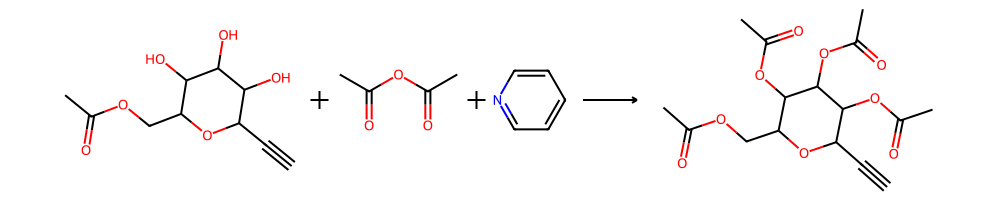

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

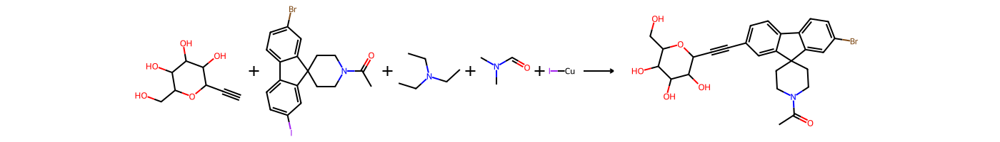

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

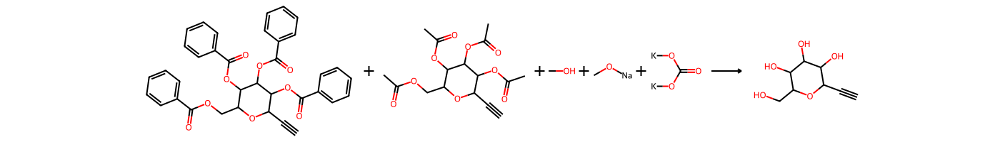

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

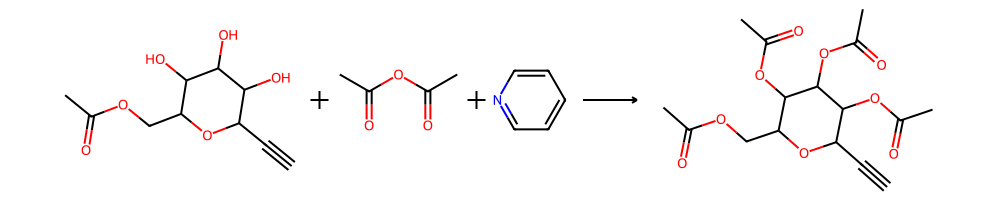

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

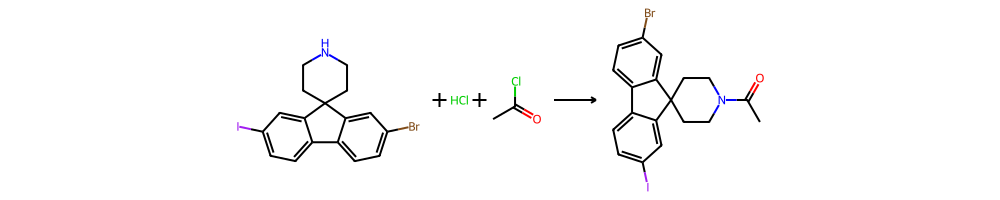

###  Showing path  14  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

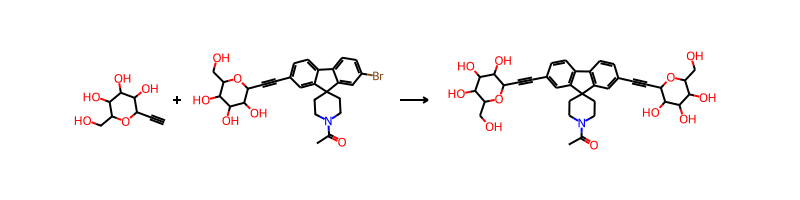

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

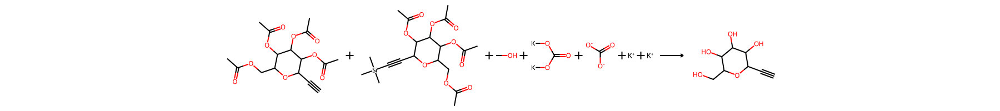

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

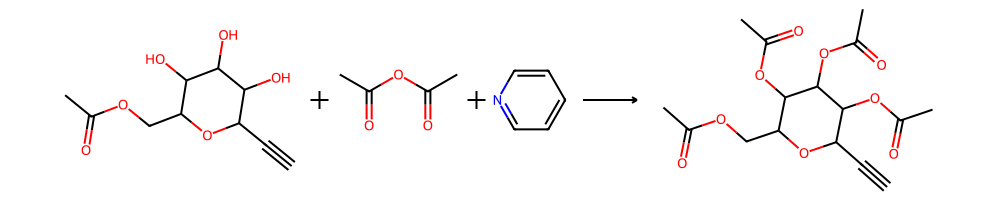

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

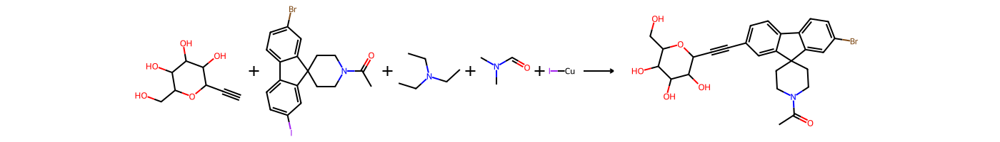

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

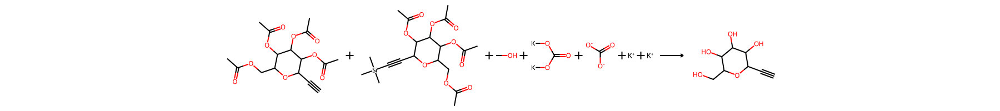

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

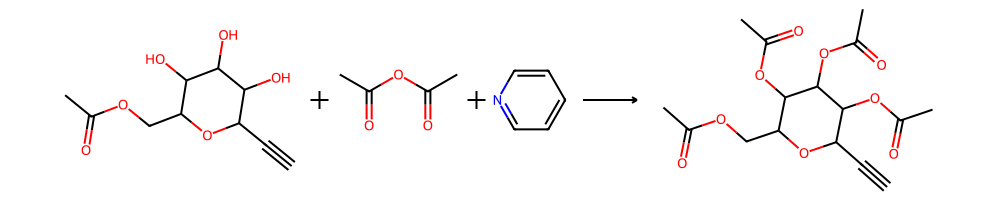

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

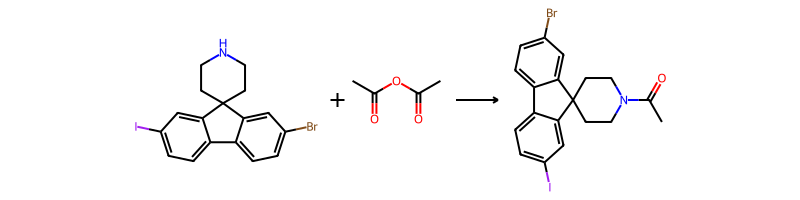

###  Showing path  15  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

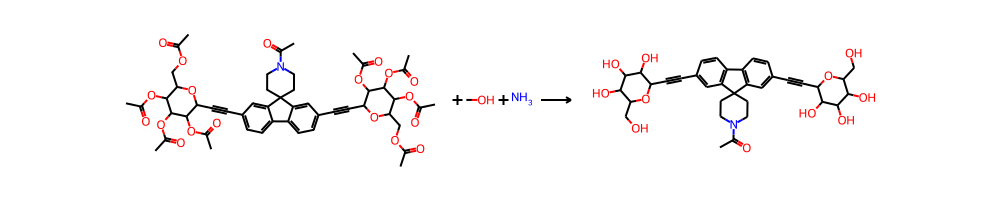

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

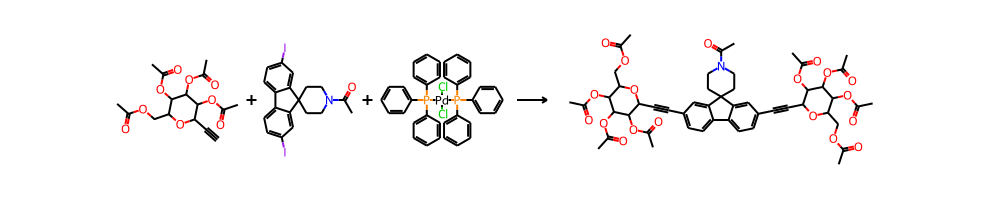

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

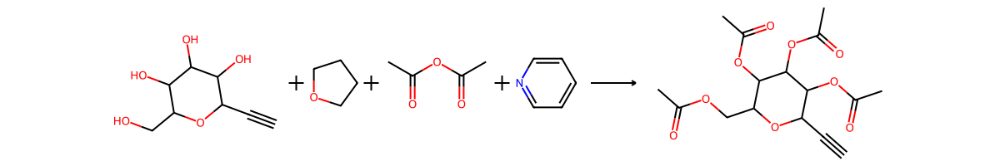

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

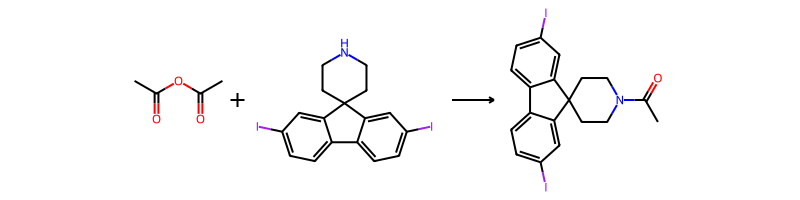

###  Showing path  16  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

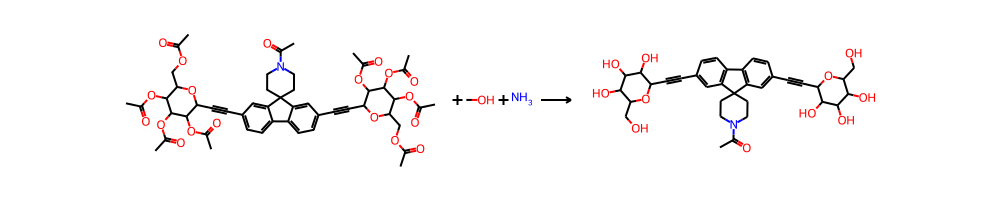

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

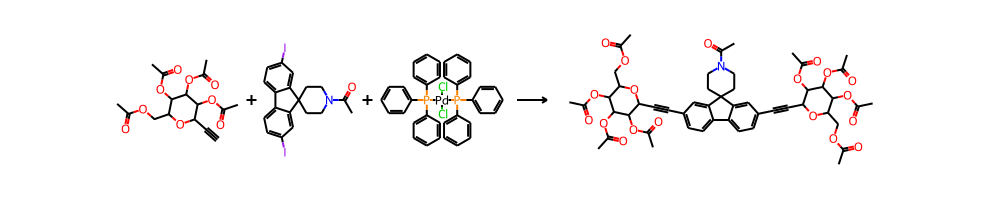

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

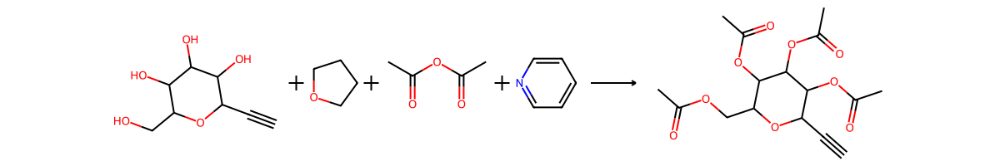

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

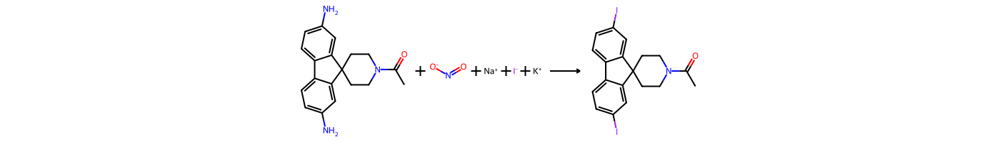

###  Showing path  17  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

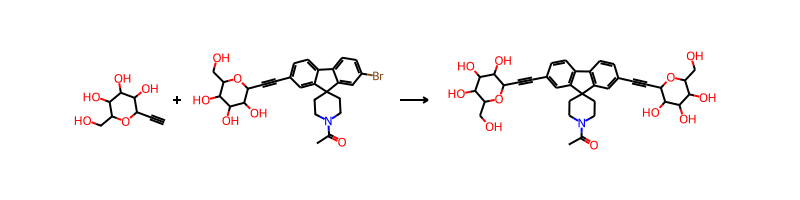

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

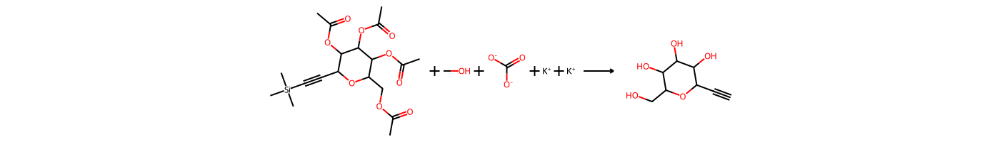

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

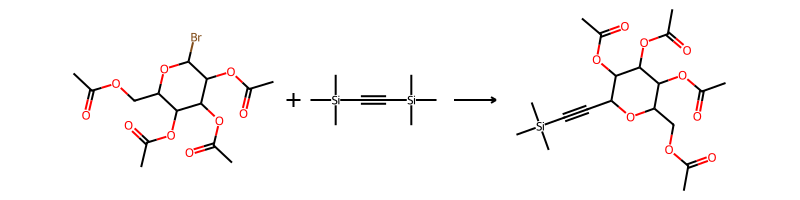

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

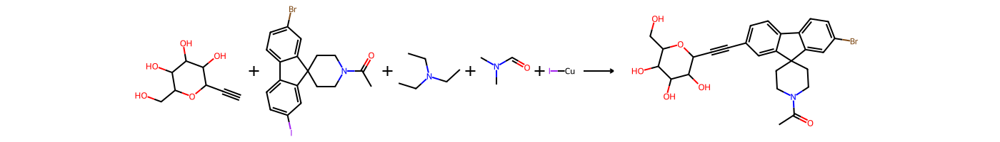

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

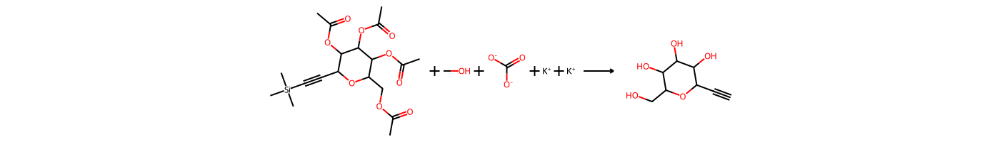

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

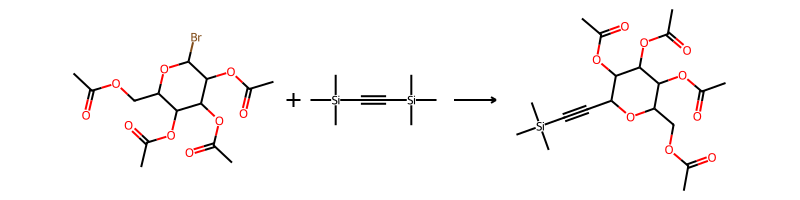

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

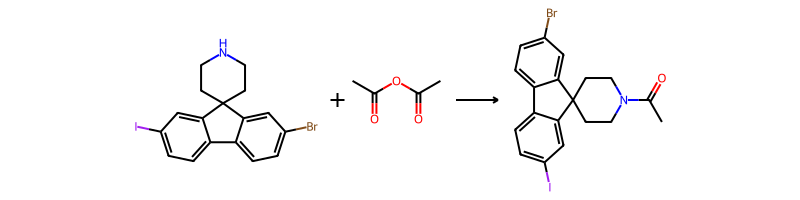

###  Showing path  18  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

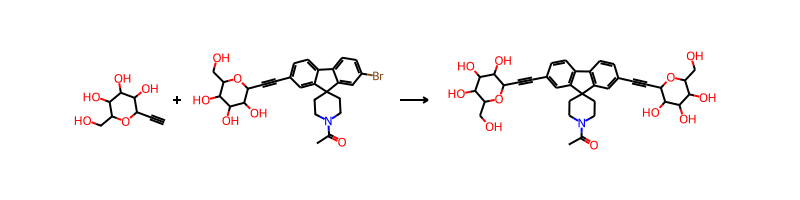

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

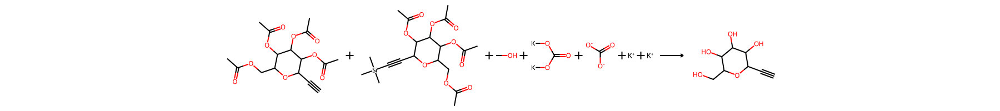

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

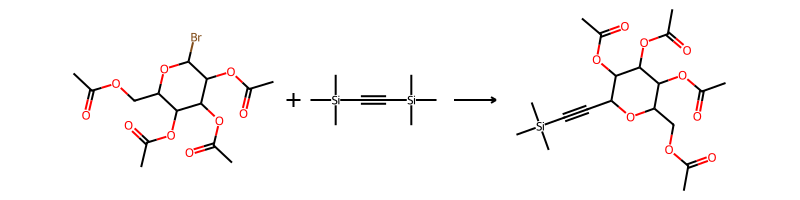

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

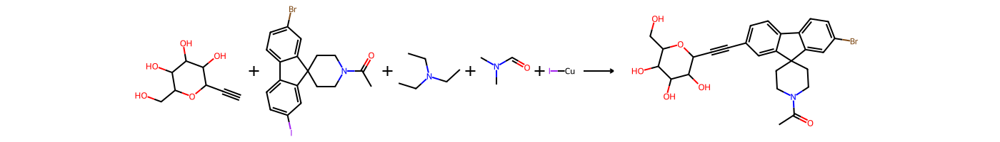

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

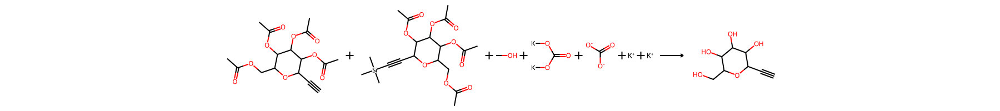

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

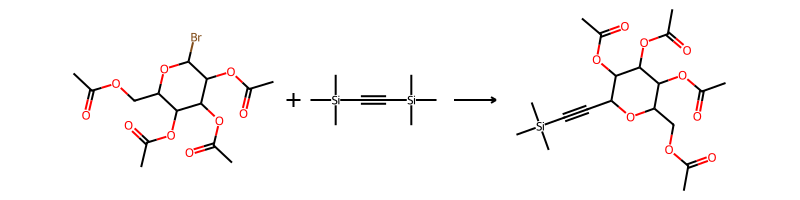

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

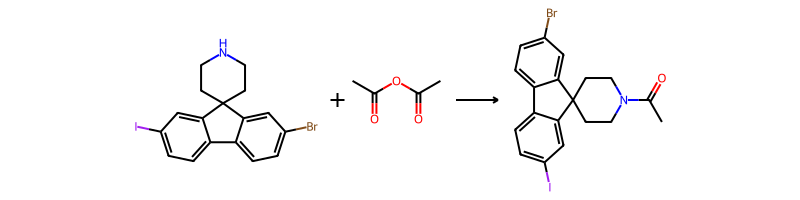

###  Showing path  19  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

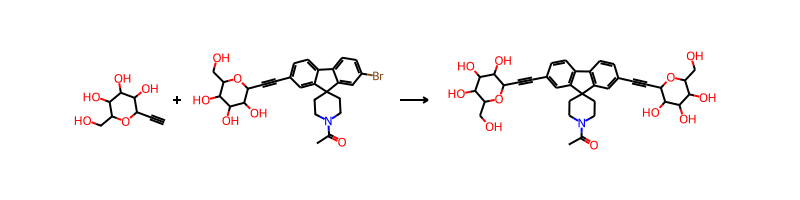

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

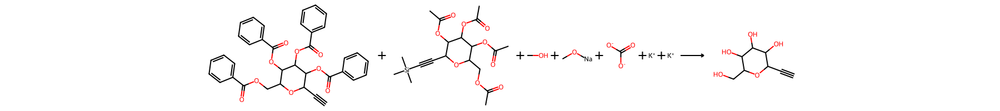

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

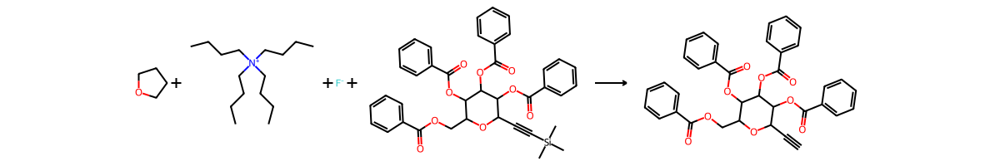

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

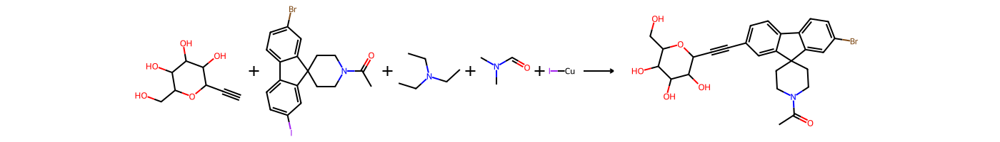

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

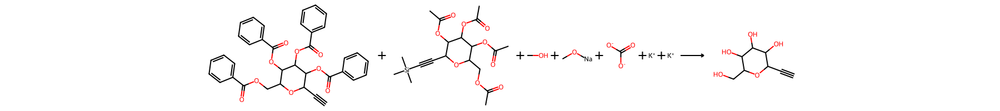

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

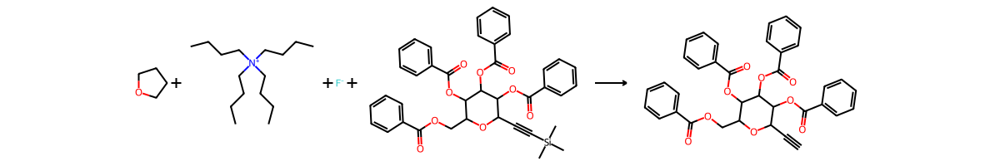

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

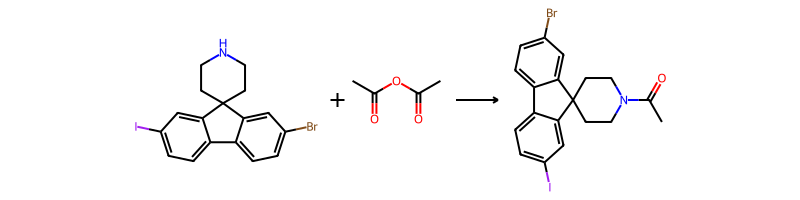

###  Showing path  20  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

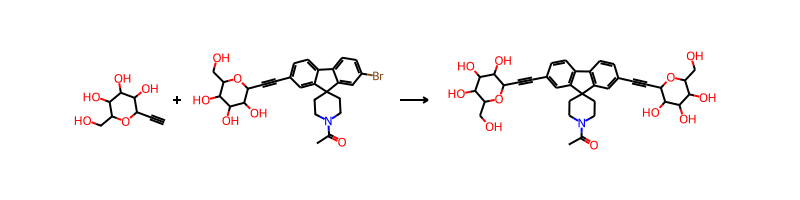

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

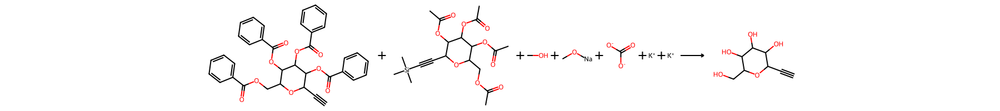

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

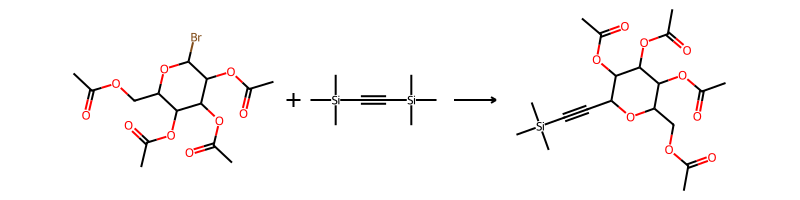

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

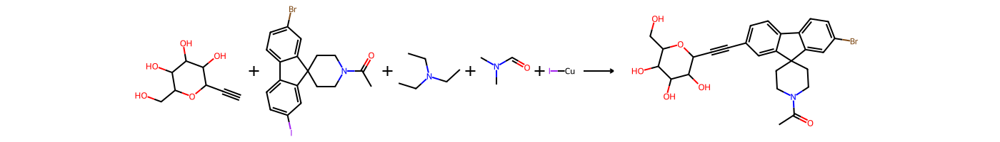

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

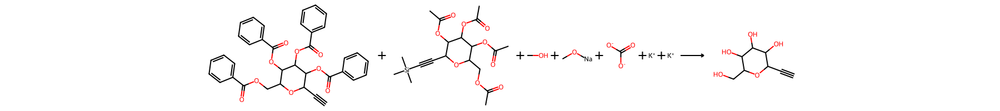

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

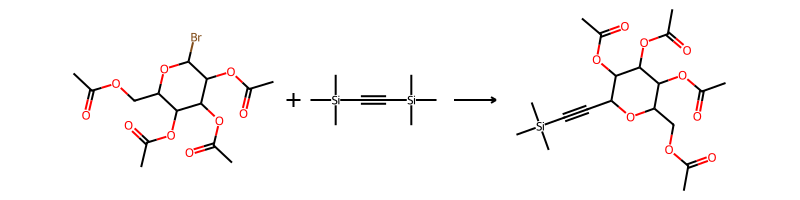

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

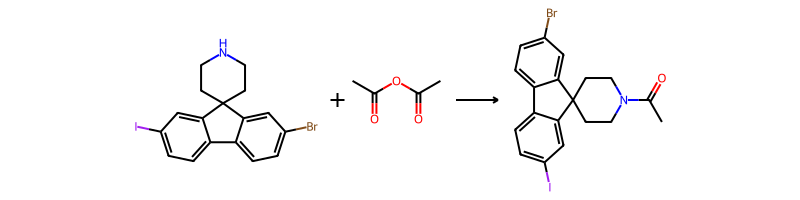

###  Showing path  21  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

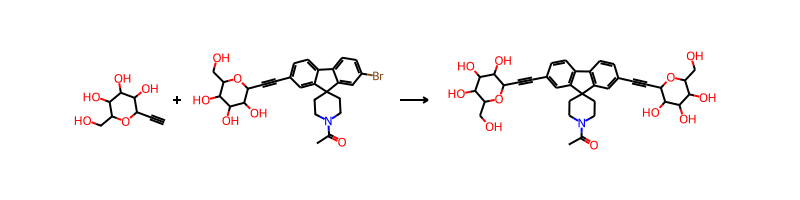

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

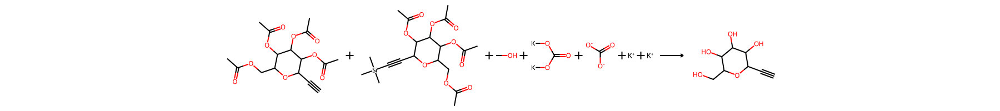

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

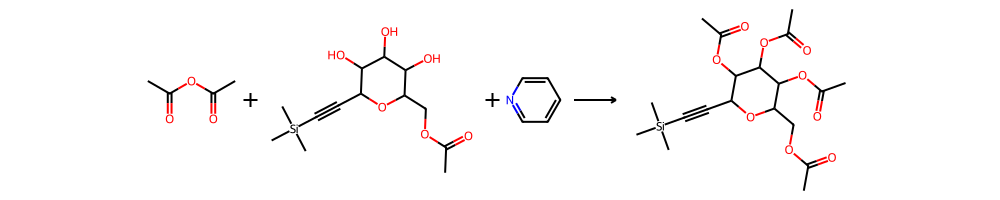

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

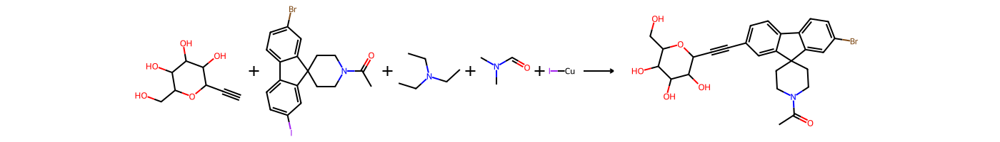

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

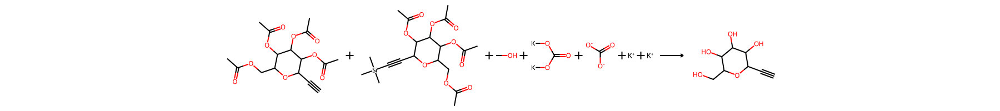

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

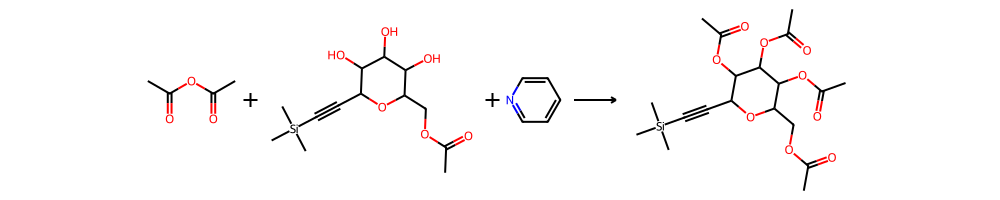

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

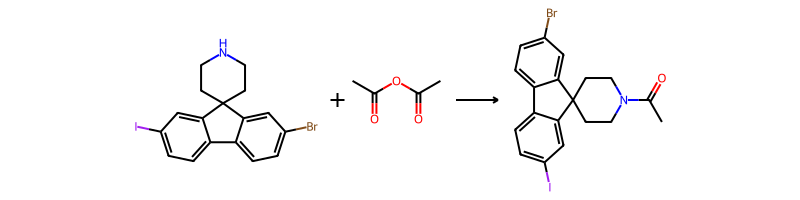

###  Showing path  22  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

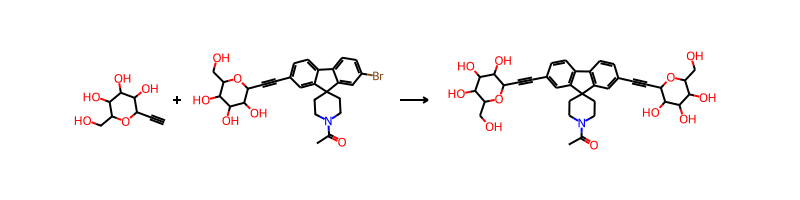

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

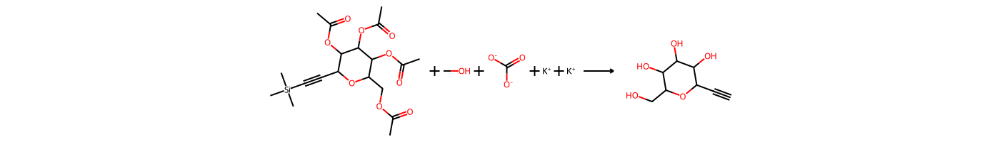

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

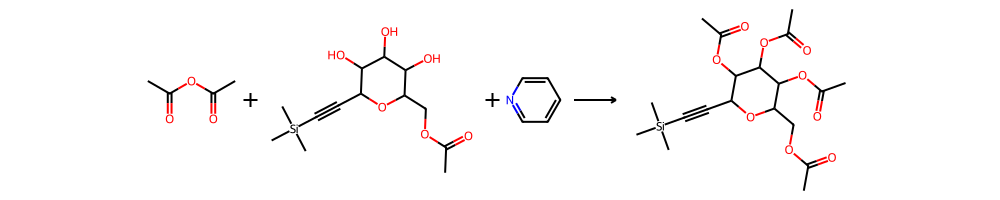

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

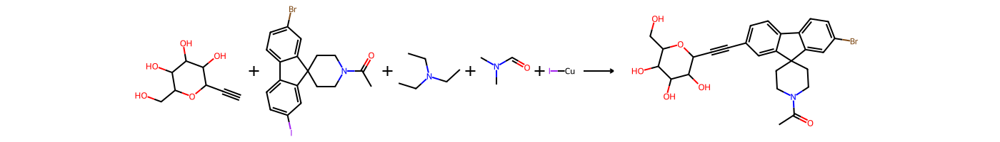

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

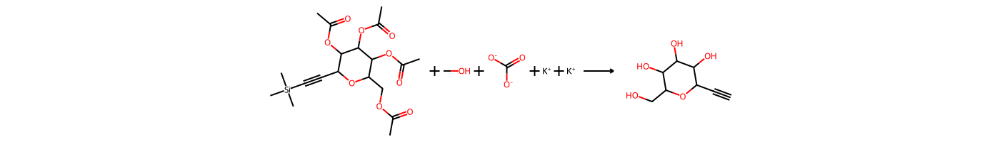

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

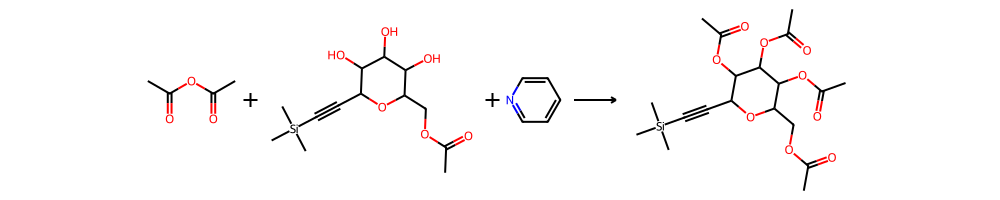

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

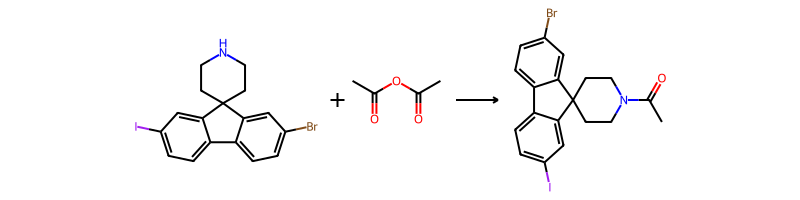

###  Showing path  23  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

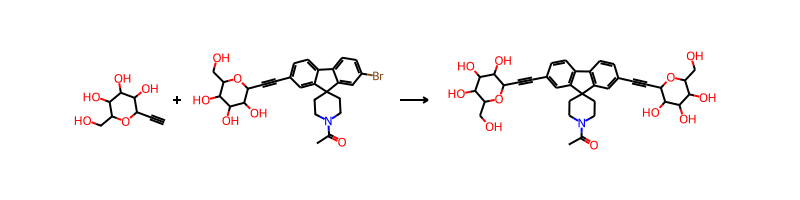

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

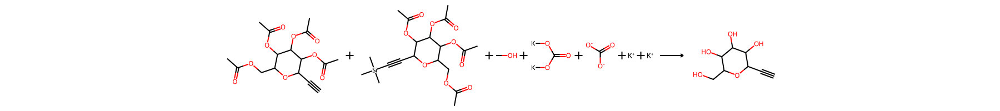

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

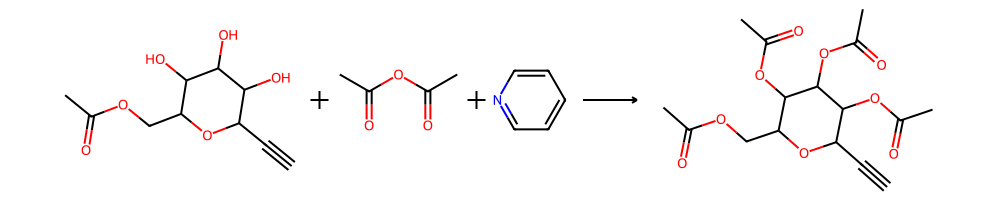

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

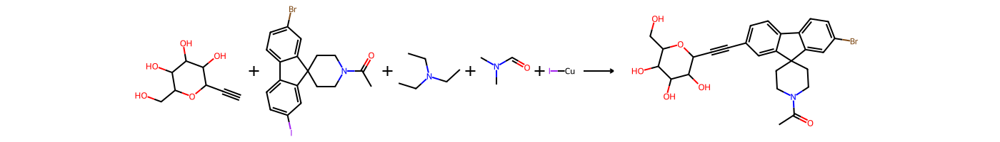

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

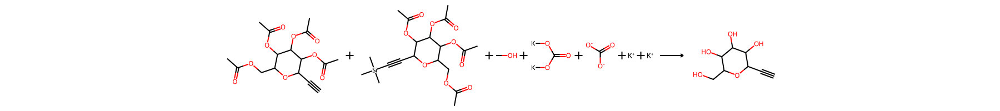

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

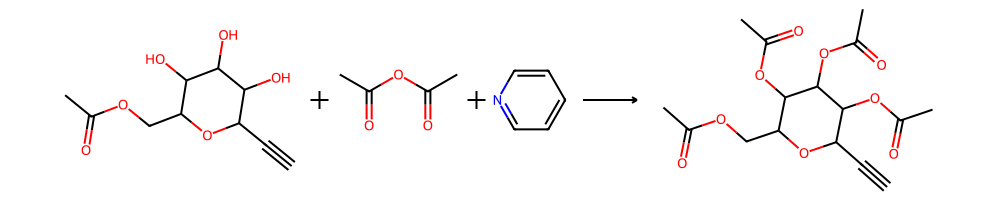

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

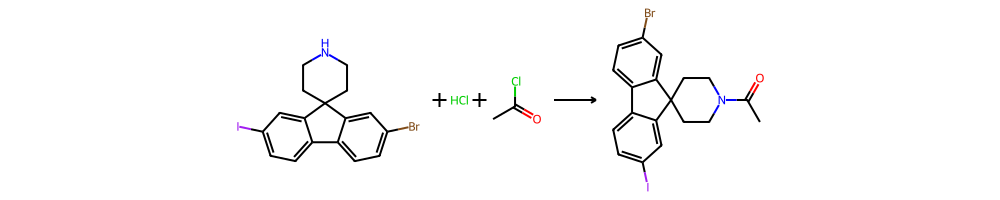

###  Showing path  24  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

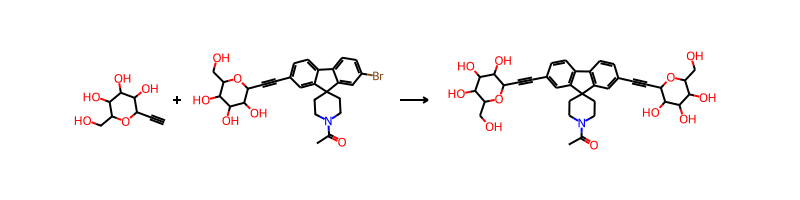

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

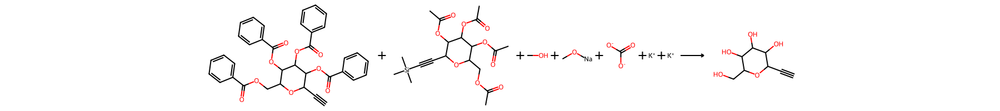

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

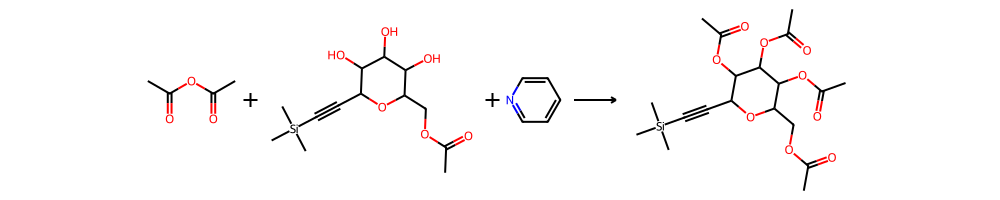

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

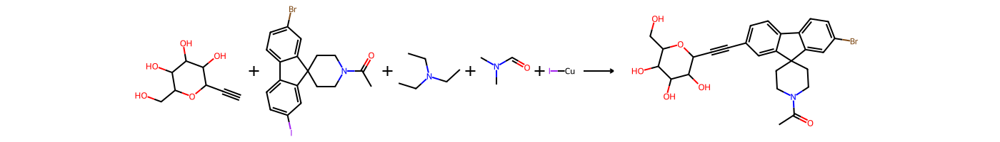

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

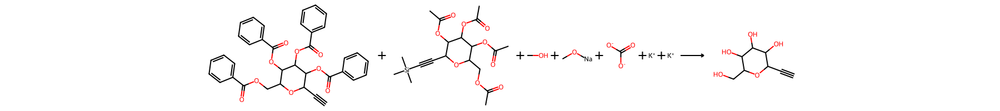

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

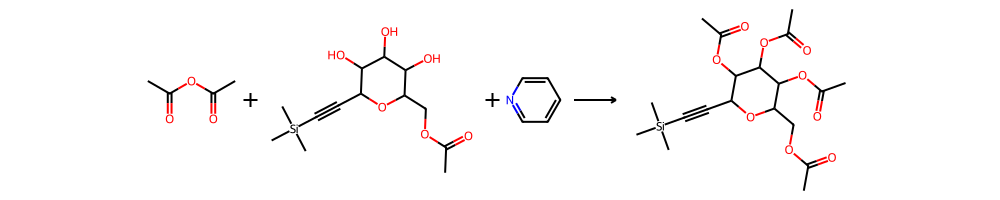

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

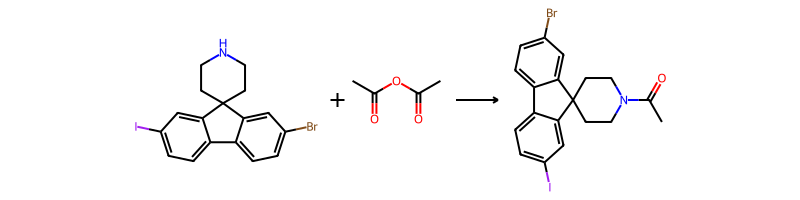

###  Showing path  25  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

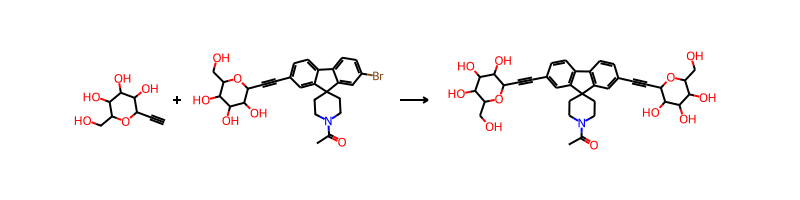

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

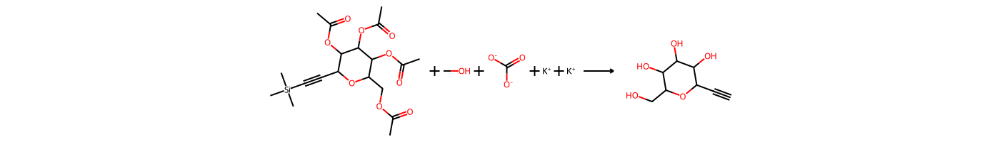

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

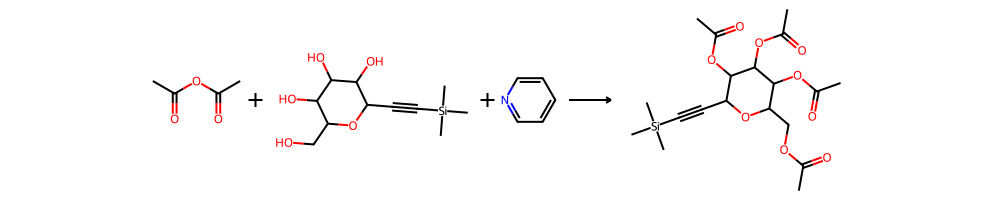

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

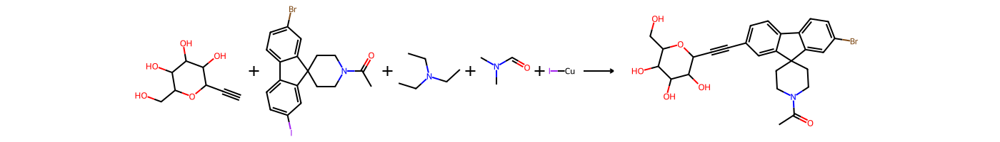

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

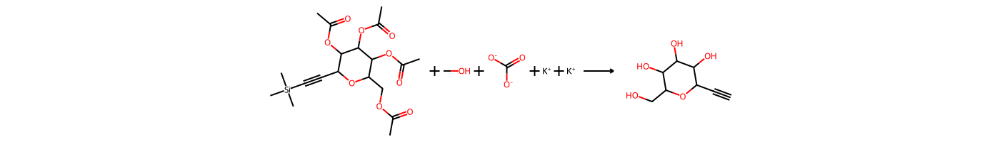

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

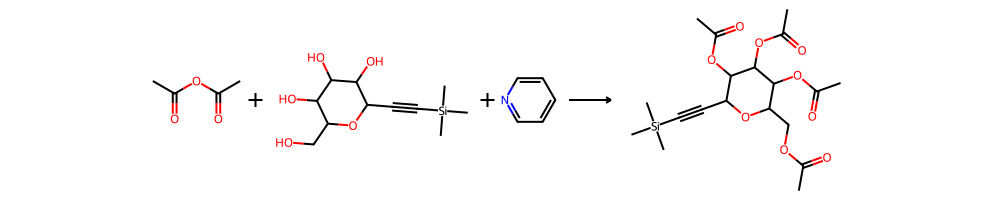

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

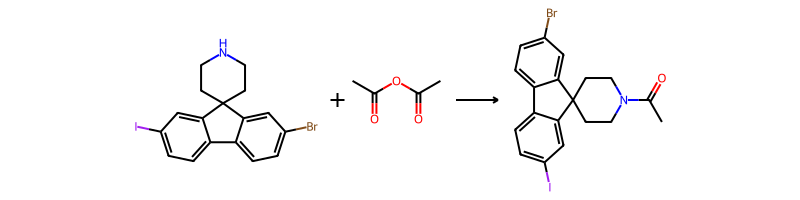

###  Showing path  26  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

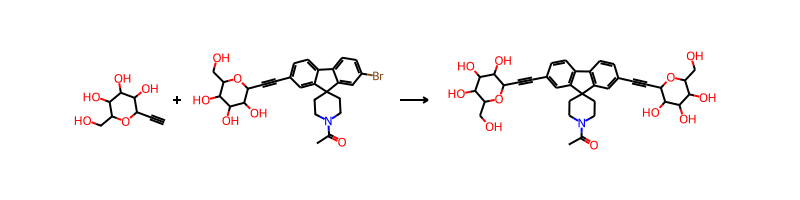

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

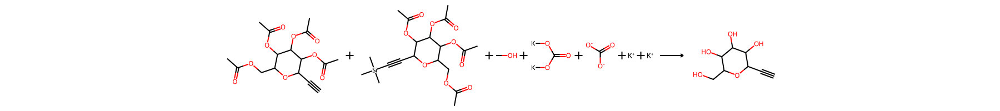

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

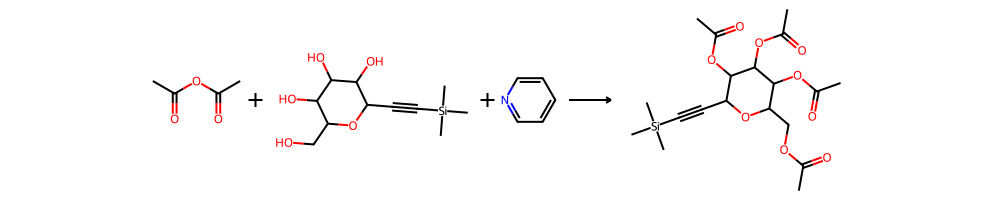

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

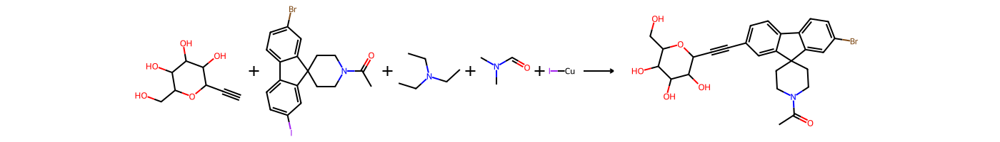

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

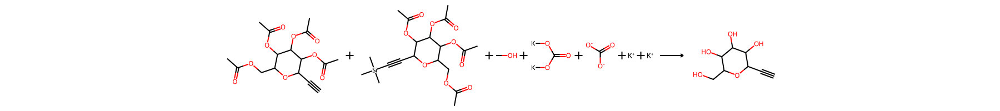

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

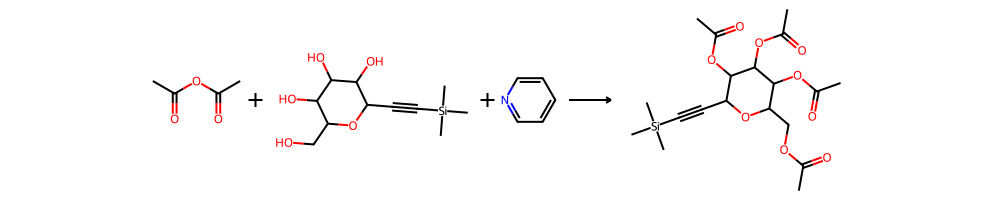

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

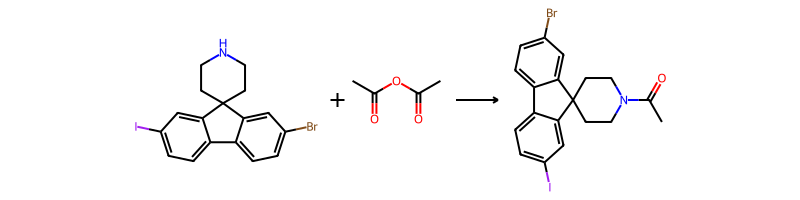

###  Showing path  27  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

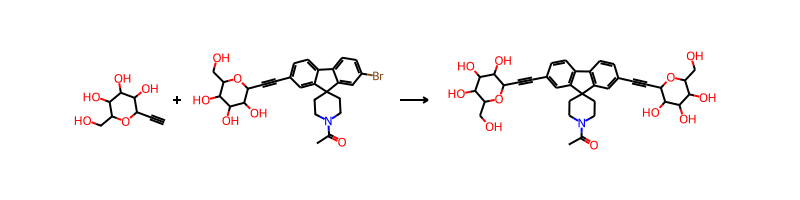

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

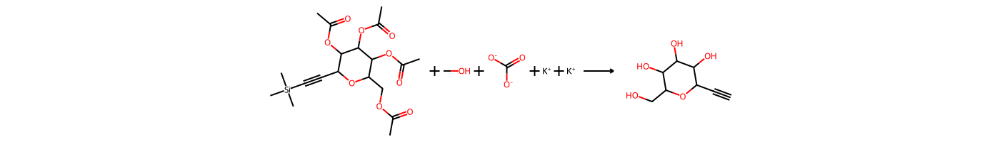

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

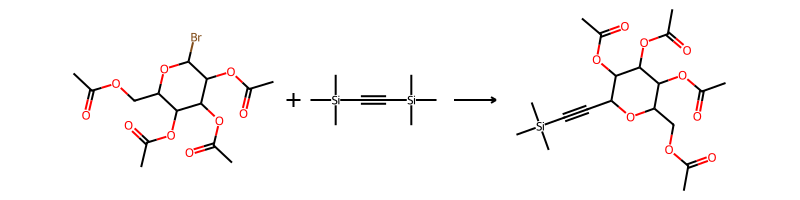

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

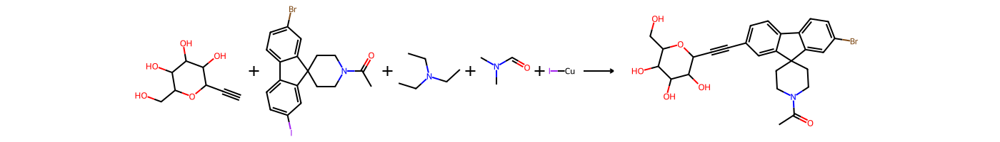

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

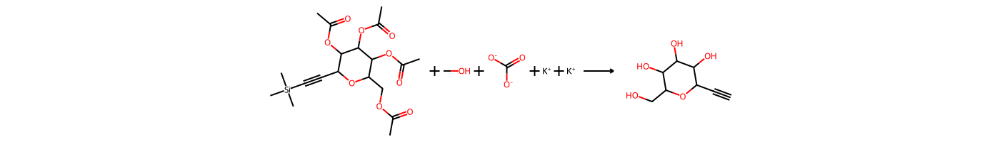

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

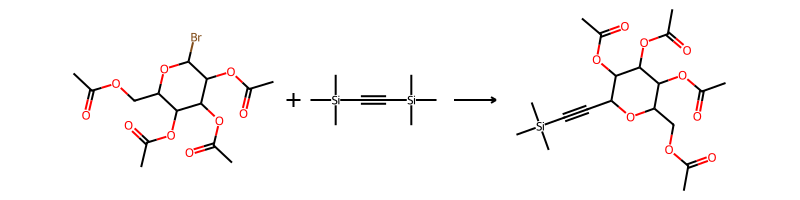

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

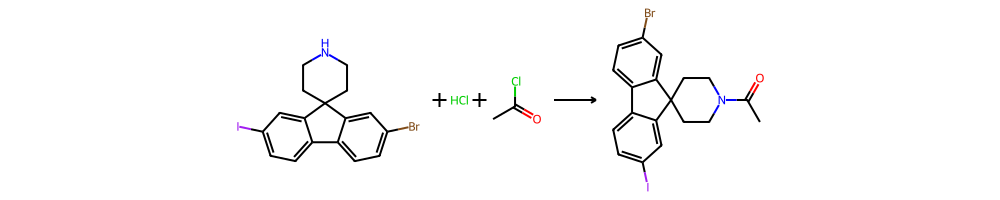

###  Showing path  28  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

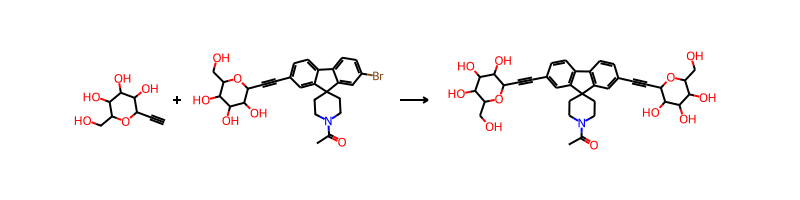

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

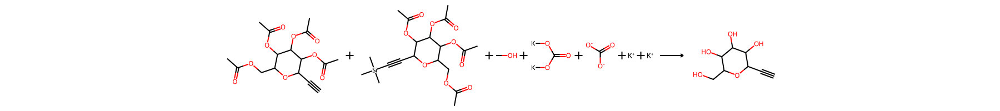

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

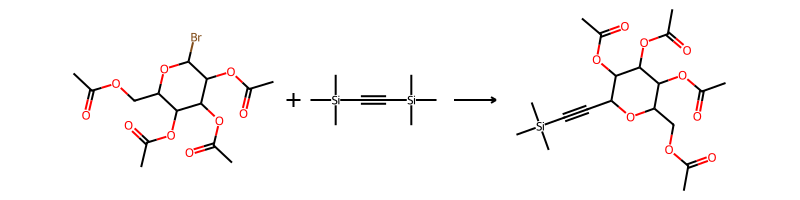

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

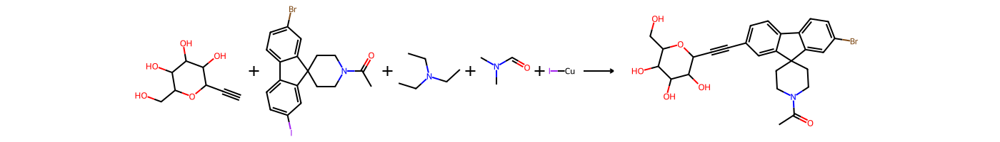

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

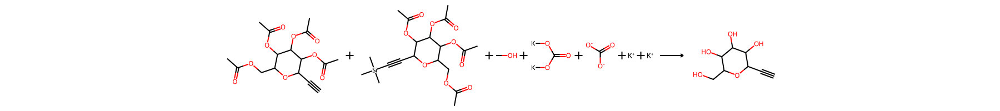

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

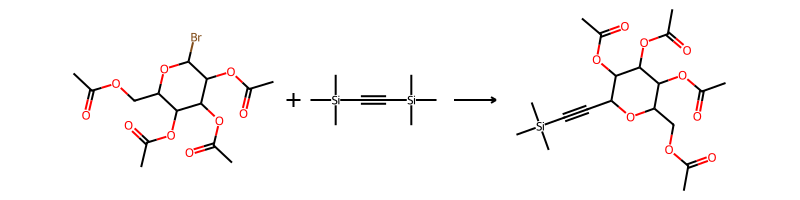

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

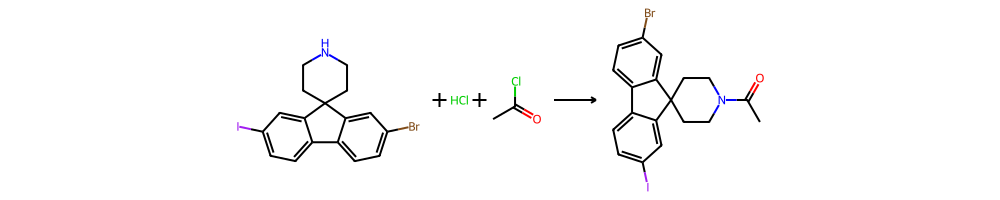

###  Showing path  29  with confidence 0.999:

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

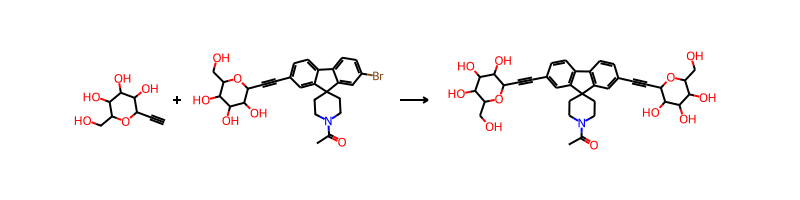

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

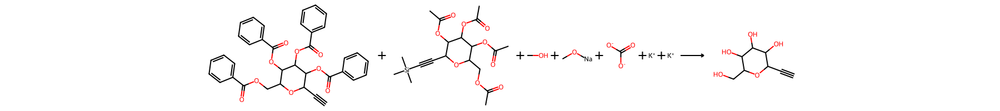

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

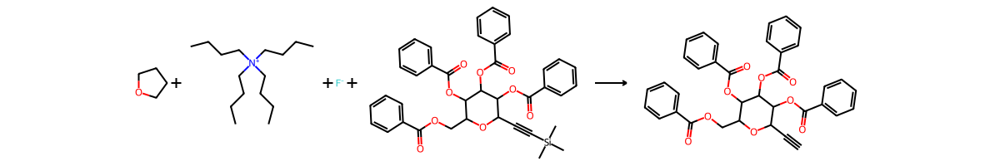

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

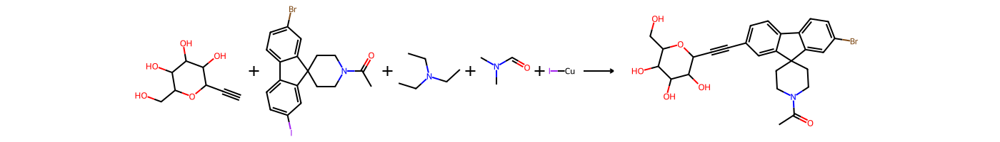

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

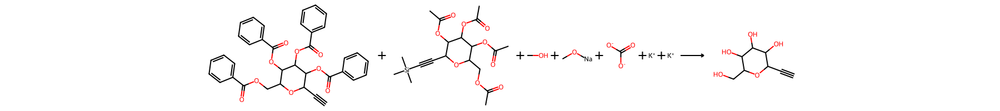

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

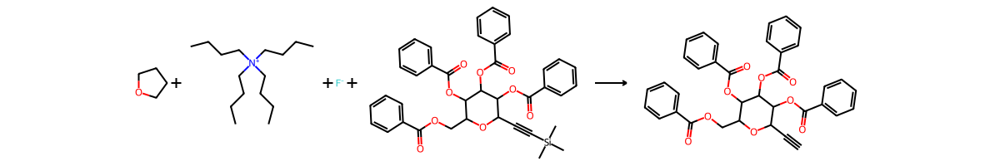

<span style="color: green"> Reaction: </span>CC(=O)OCC1OC(C#Cc2ccc3c(c2)C2(CCN(C(C)=O)CC2)c2cc(C#CC4OC(COC(C)=O)C(OC(C)=O)C(OC(C)=O)C4OC(C)=O)ccc2-3)C(OC(C)=O)C(OC(C)=O)C1OC(C)=O + CO + N --->> CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O

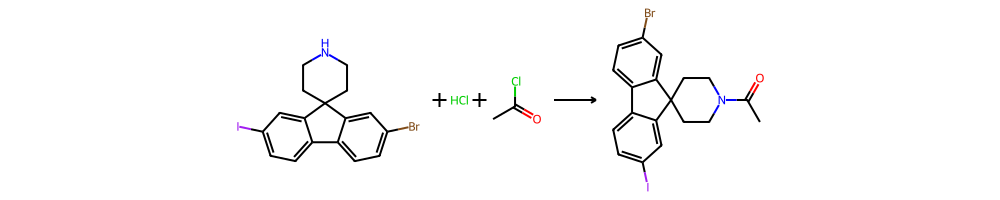

In [20]:

%openad predict retrosynthesis 'CC(=O)N1CCC2(CC1)C3=C(C=CC(=C3)C#CC4C(C(C(C(O4)CO)O)O)O)C5=C2C=C(C=C5)C#CC6C(C(C(C(O6)CO)O)O)O' using( max_steps=3 )

In [21]:
%openad interpret recipe 'To a stirred solution of 7-(difluoromethylsulfonyl)-4-fluoro-indan-1-one (110 mg, 0.42 mmol)\
in methanol (4 mL) was added sodium borohydride \
(24 mg, 0.62 mmol). The reaction mixture was stirred at ambient temperature for 1 hour.'

***See the following actions from the Recipe:***
1. MAKESOLUTION with 7-(difluoromethylsulfonyl)-4-fluoro-indan-1-one (110 mg, 0.42 mmol) and methanol (4 mL)
2. ADD SLN
3. ADD sodium borohydride (24 mg, 0.62 mmol)
4. STIR for 1 hour at ambient temperature


In [ ]:
import pandas
lst = ['BrBr.c1ccc2cc3ccccc3cc2c1CCO' ,'Cl.CCC(=O)NCCC.O'] 
batch_list = pandas.DataFrame(lst,columns=['reactions'])
%openad predict reaction topn in batch from dataframe batch_list using (topn=6)

In [ ]:

%openad  predict reaction 'Cl.CCC(=O)NCCC.O'

In [ ]:
%openad import  from '~/openad_notebooks/examples/reactions.csv' to 'reactions.csv'
%openad predict reaction in batch from file 'reactions.csv'

### NOTE there is a problem with Pyparsing and Ipykernel that "may appear" here as 
***Function call Failed: Likely Server Unresponsive check above error***

### If So refresh Notebook kernel and re-run... in process of reporting to Pyparsing 

In [ ]:
%openad predict reaction in batch from list ['BrBr.c1ccc2cc3ccccc3cc2c1CCO' ,'Cl.CCC(=O)NCCC.O'] 

In [ ]:
%openad predict reaction in batch  from list ['BrBr.c1ccc2cc3ccccc3cc2c1CCO' ,'BrBr.c1ccc2cc3ccccc3cc2c1','Cl.CCC(=O)NCCC.O'] use_saved